### Imports

Firstly we import libraries we will need in this study

In [1]:
import matplotlib.pyplot as plt  # plots
import numpy as np  # vectors and matrices
import pandas as pd  # tables and data manipulations
import seaborn as sns  # more plots

sns.set()

import warnings  
from itertools import product

import statsmodels.api as sm
import statsmodels.tsa.api as smt
from tqdm.notebook import tqdm

warnings.filterwarnings("ignore") # `do not disturbe` mode

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

The dataset is historical data on Tomato Prices.

It has the following **columns**:

**Date:** the date of the price data

**Maximum Price:** the highest price of tomatoes for that day

**Minimum Price:** the lowest price of tomatoes for that day

**Average Price:** the average price of tomatoes for that day

In [2]:
tomatoes = pd.read_csv('Tomato.csv', index_col='Date', parse_dates=['Date'])

### Data investigation

Now let's take a glance at the dataset

In [3]:
tomatoes.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2741 entries, 2013-06-16 to 2021-05-13
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Unit     2741 non-null   object 
 1   Minimum  2741 non-null   int64  
 2   Maximum  2741 non-null   int64  
 3   Average  2741 non-null   float64
 4   Market   2741 non-null   object 
dtypes: float64(1), int64(2), object(2)
memory usage: 128.5+ KB


In [4]:
tomatoes.describe()

,Minimum,Maximum,Average
count,2741.000000,2741.000000,2741.000000
mean,35.089748,41.281284,38.185516
std,16.648425,17.364135,16.970949
min,8.000000,12.000000,10.000000
25%,22.000000,30.000000,25.000000
50%,30.000000,38.000000,35.000000
75%,45.000000,50.000000,47.500000
max,115.000000,120.000000,117.500000


In [5]:
tomatoes.head(3)

,Unit,Minimum,Maximum,Average,Market
Date,,,,,
2013-06-16,Kg,26,32,29.0,Tomato
2013-06-17,Kg,20,25,22.5,Tomato
2013-06-18,Kg,22,26,24.0,Tomato


In [6]:
tomatoes[['Unit', 'Market']].nunique()

Unit      1
Market    1
dtype: int64

We won't need *Unit* and *Market* columns, since they both only contain singular repeating value (*Kg* and *Tomato*, respectively) within itselves, so we will simply drop them.

In [7]:
tomatoes.drop(['Unit', 'Market'], axis=1, inplace=True)
tomatoes.sample(3)

,Minimum,Maximum,Average
Date,,,
2018-08-12,38,40,39.0
2016-08-11,50,60,55.0
2016-01-17,15,20,17.5


Fortunately, the dataset doesn't have any *NaN* values as we've seen in it's **.info()**. We can confirm it by running **.isnull()**.

In [8]:
tomatoes.isnull().value_counts()

Minimum  Maximum  Average
False    False    False      2741
Name: count, dtype: int64

Let's check data types of each column in the dataset

In [9]:
print(f'''Data type of the index column with dates is: \033[1m{tomatoes.index.dtype}\033[0m
      \nTypes of data columns are:\n\033[1m{tomatoes.dtypes}\033[0m''')

Data type of the index column with dates is: datetime64[ns]
      
Types of data columns are:
Minimum      int64
Maximum      int64
Average    float64
dtype: object


All types look fine. Now we can start working with our data. Plotting it will let us visually inspect our subject and gain some useful insights. This is called ***Exploratory Visual Analysis***. We'll use the *Average* price of tomatoes for this study.

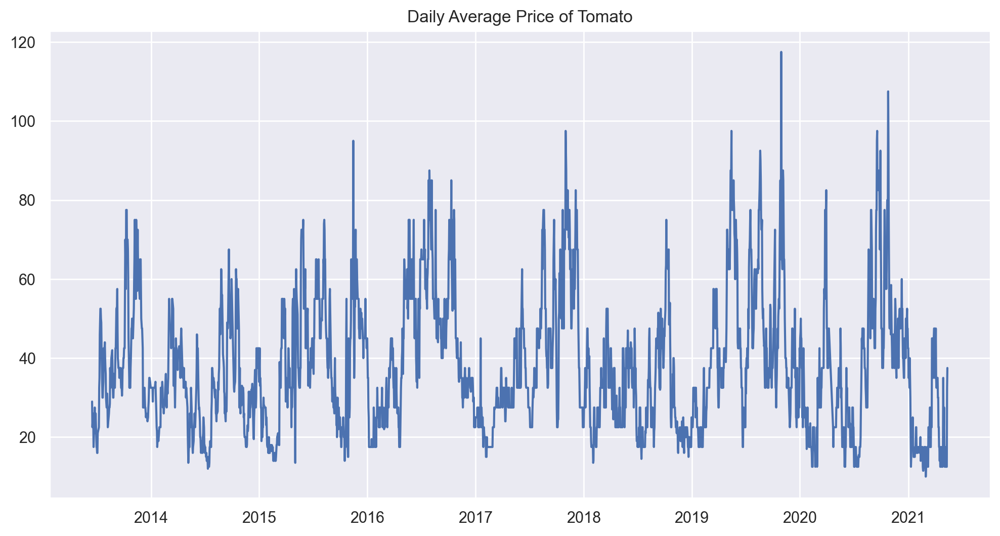

In [10]:
colname = ['Average']
df = tomatoes[colname]

plt.figure(figsize=(12, 6))
plt.plot(df)
plt.title("Daily Average Price of Tomato")
plt.grid(True)
plt.show()

On this plot we can clearly see seasonality in average tomato prices (which can be explained by harvest seasons, for example). Also there seems to be a little downward trend in average price.

### Seasonality Exploration and Dimensionality Reduction

In [11]:
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax

<Axes: title={'center': 'Seasonal Plot (year/dayofyear)'}, xlabel='dayofyear', ylabel='Average'>

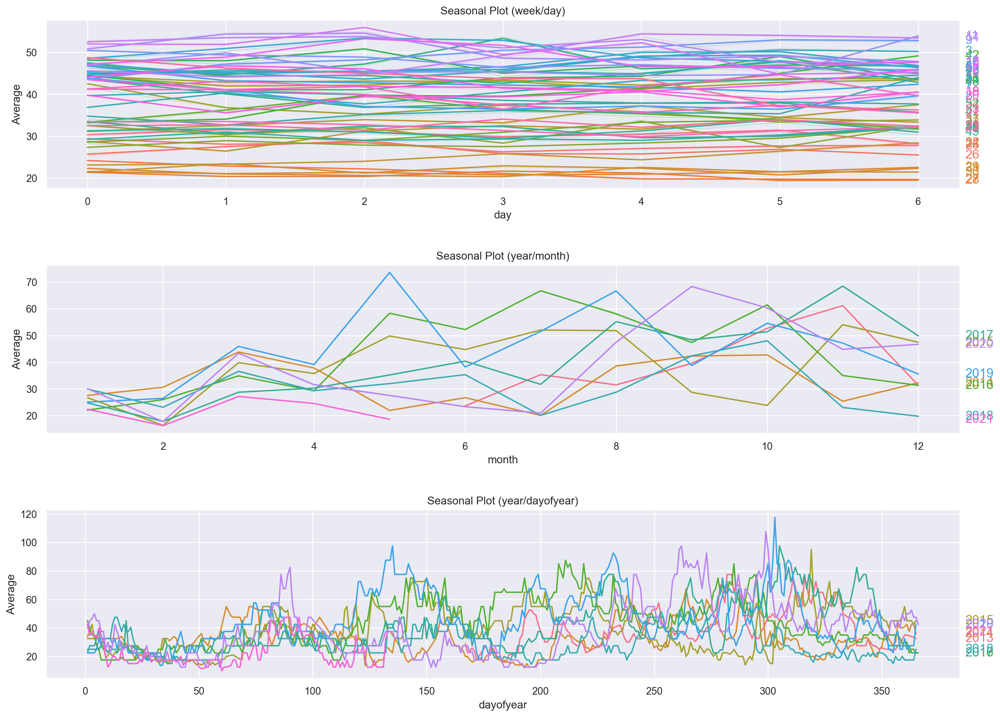

In [12]:
X = df.copy()
X = df.set_index(df.index).to_period('D')

X['day'] = X.index.dayofweek
X['week'] = X.index.week
X['month'] = X.index.month

X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(16, 12))
fig.tight_layout(pad=5.0)
seasonal_plot(X, y="Average", period="week", freq="day", ax=ax0)
seasonal_plot(X, y="Average", period="year", freq="month", ax=ax1)
seasonal_plot(X, y="Average", period="year", freq="dayofyear", ax=ax2)

Seems like there is some seasonality in our plots. Average prices are higher towards the end of the year and right after the new year are the period of low prices. But no apparent weekly seasonality at all.

The next possible step could be reducing the dimensionalyti of our data by dropping days and replacing them by months, taking the average of days in a month as the value of new 'monthly average' column. This would reduce the amount of data in the dataset roughly dy 30 times, but also might make predictions less specific since now we would only be able to predict average prices monthly instead of daily.

<Axes: xlabel='Date'>

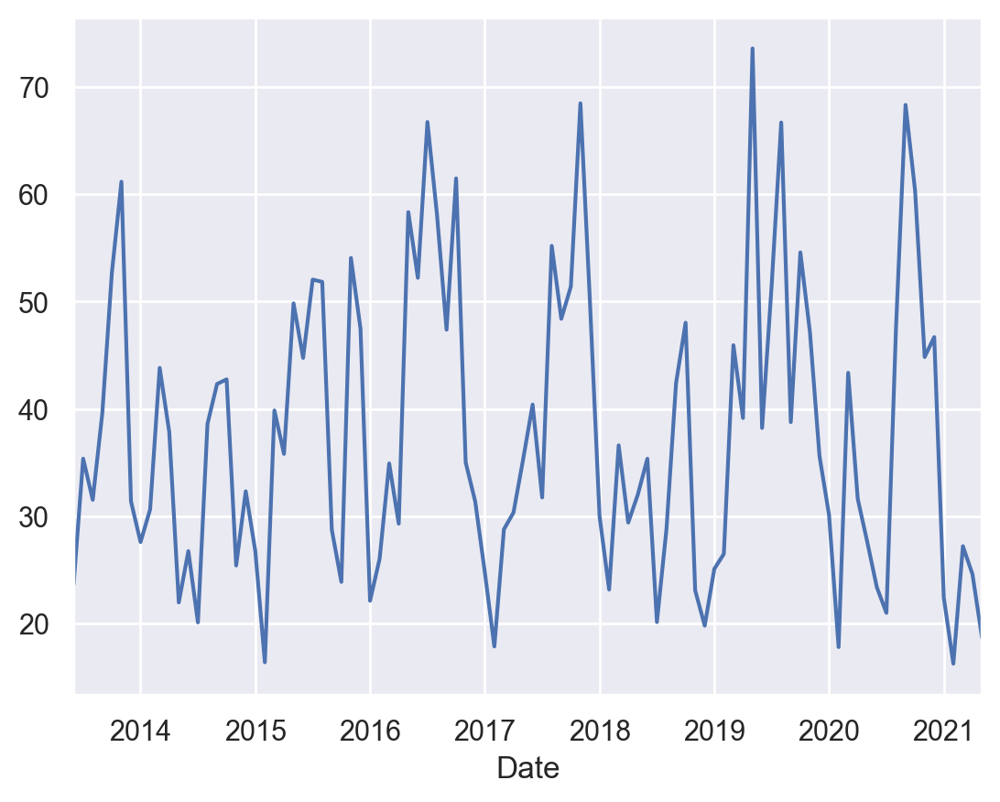

In [13]:
reduced_df = X.groupby(['year', 'month']).agg({'Average': 'mean'}).copy()
reduced_df = reduced_df.reset_index(level=[0,1])
reduced_df['y-m'] = reduced_df.year.astype(str) + '-' + reduced_df.month.astype(str)
reduced_df['y-m'] = pd.to_datetime(reduced_df['y-m'])
reduced_df = reduced_df.set_index('y-m')
reduced_df = reduced_df.drop(['year', 'month'], axis=1)
reduced_df.index = reduced_df.index.rename('Date')

reduced_df.Average.plot()

For now it seems that the dimensionality of our data is fine without reduction, so we won't change anything. However, on large datasets, familiarity with this technique may come in quite handy.

**We will get rid of the sisonality in a later step**

### Metrics

We will use *Mean Absolute Error* (**MAE**), which is convenient because of it's ease of interpretation, since it has same units of measurement as the inital series.
$$ MAE = \frac{\sum_{i=1}^{n} |y_{i}-\widehat{y_{i}}|}{n} $$

Also we will use *Mean Absolute Percentage Error* (**MAPE**), since almost the same as MAE but is converted to percents instead of units, which is even more handy and interpretable, especially when you need to compare models on different datasets.
$$ MAPE = \frac{100}{n}\frac{\sum_{i=1}^{n} |y_{i}-\widehat{y_{i}}|}{y_{i}} $$

In [14]:
from sklearn.metrics import mean_absolute_error


def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

### Moving average

Let's explore one of the simplest and obvious way to make prediction model. The method is based on the assumption that *the next day can be described by the average of several past days*.
$$ \hat{y}_{t} = \frac{1}{k} \displaystyle\sum^{k}_{n=1} y_{t-n} $$

In [15]:
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):

    """
        series - dataframe with timeseries
        window - rolling window size
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies
    """
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(17, 8))
    plt.title(f"Moving average\n window size = {window}")
    plt.plot(rolling_mean, "g", label="Rolling mean trend", zorder=1)

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "y--", label="Upper Bond / Lower Bond of 95% Confidence Interval")
        plt.plot(lower_bond, "y--")

        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series < lower_bond] = series[series < lower_bond]
            anomalies[series > upper_bond] = series[series > upper_bond]
            plt.plot(anomalies, "ro", markersize=10)

    plt.plot(series[window:], label="Actual values", zorder=2)
    plt.legend(loc="upper left")
    plt.grid(True)

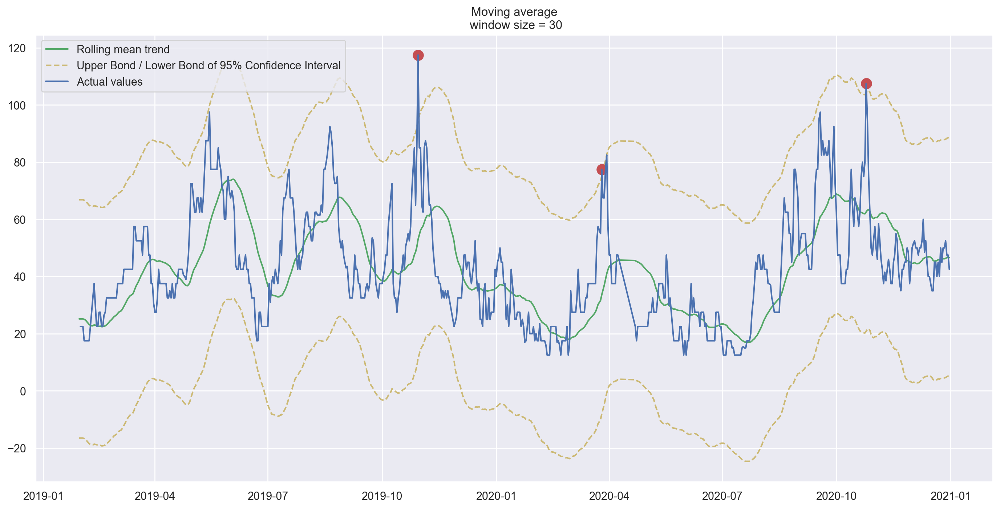

In [16]:
plotMovingAverage(df['2019':'2020'], 30, plot_intervals=True, plot_anomalies=True)

By changing the size of the window we can look at weekly(7 days window), monthly(30 days), quarterly(90 days), ... trends of the dataset.

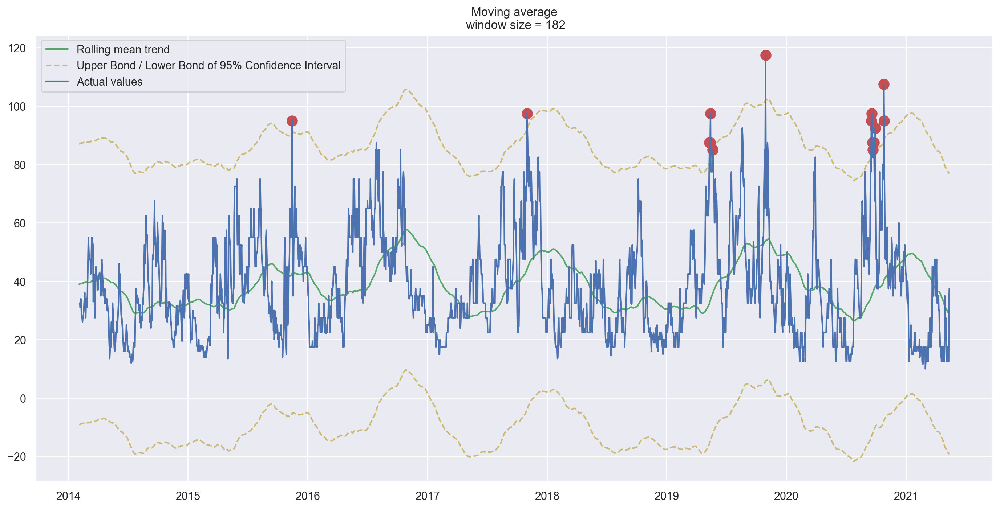

In [17]:
plotMovingAverage(df, 182, plot_intervals=True, plot_anomalies=True)


Seems like the anomalies that the model caught are actually seasonal change of price in autumn, so it most likely is just a **Type 1 Error** (*False Positive*)

In [18]:
type(df.rolling(5).mean())

pandas.core.frame.DataFrame

### Stationarity

On the image below ilustrated what stationary and non-stationary series looks like. In general, non-stationary series do not have trend (mean doesn't increase over time), have stable variance and should not have any changes in behavior based on time.

<p align="center">
  <img src="stationarity.png" />
</p>

We were lucky to have almost stationary looking data, but in other cases we would have needed to *detrend* and *deseason* the data before applying methods working on stationary data.

We will run **Dickey-Fuller** as it is one of the simplest ways to prove that our time series is indeed stationary.

Text(0.5, 1.0, 'Dickey-Fuller test: p=0.000')

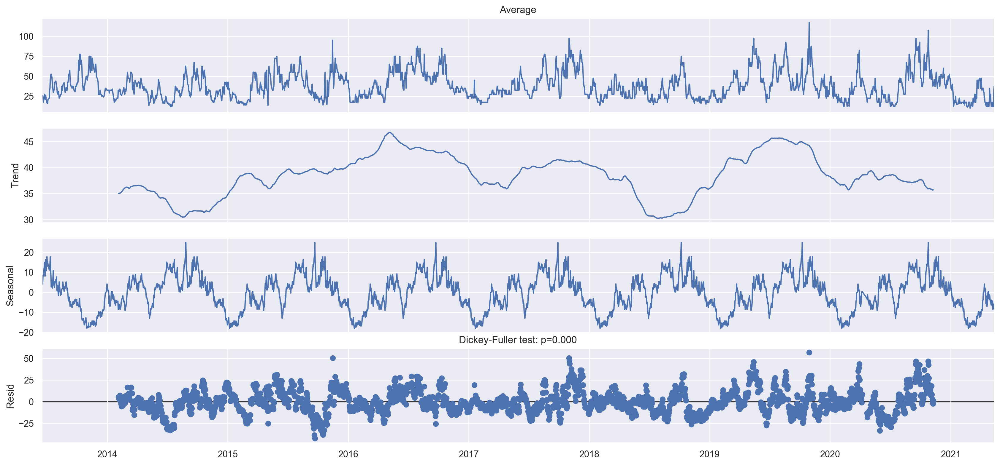

In [19]:
plt.rcParams["figure.figsize"] = (17, 8)

sm.tsa.seasonal_decompose(df.Average, period=365).plot()
plt.title(f"Dickey-Fuller test: p={sm.tsa.stattools.adfuller(df.Average)[1]:.3f}")

In [20]:
def tsplot(y, lags=None, figsize=(17, 10), style="bmh"):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test

        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    with plt.style.context(style):
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        ts_ax.plot(y)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title("Time Series Analysis Plots\n Dickey-Fuller test: p={0:.3f}".format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, marker='.', markersize=0.5, c='red', linewidth=0.3)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, marker='.', markersize=0.5, c='red', linewidth=0.3)
        plt.tight_layout()

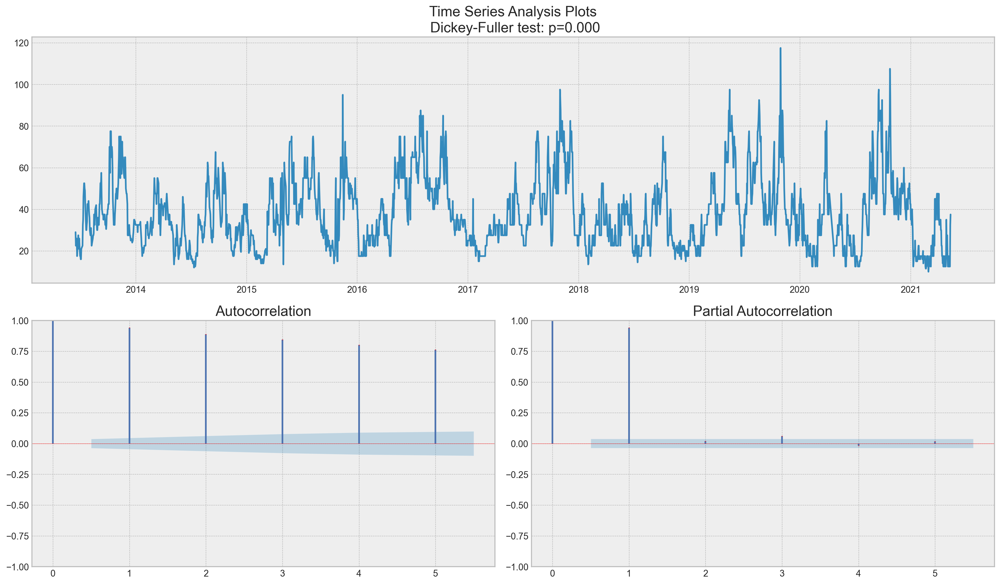

In [21]:
train_df = df.Average.loc[(df.index.year >= 2017) & (df.index.year < 2019)]
test_df = df.Average.loc[(df.index.year >= 2019) & (df.index.year < 2020)] 
tsplot(df.Average, lags=5)

*Dickey-Fuller* test confirms our hypothesis about the stationarity of the data.

But we see a strong seasonality that needs to be gotten rid of. To do so we will subtract lag of 1 day from our original data. This is called '*first difference*'.

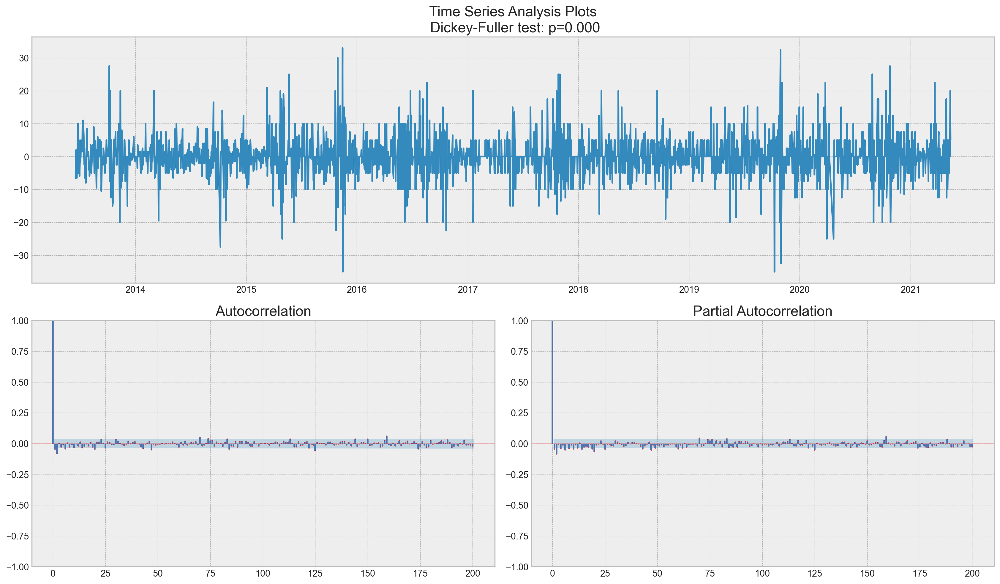

In [22]:
df_deseasoned = (df.Average - df.Average.shift(1)).dropna()
tsplot(df_deseasoned, lags=200)

### ARIMA model

Now we will build ***SARIMA(s, p, d, q)(P, D, Q)*** (**S**easonal **A**uto**R**egression **I**ntegrated **M**oving **A**verage) model.

&emsp;&emsp;&emsp;Let's delve into the acronyms and model parameters to understand what this model actualy does.

***Seasonal*** is responsible for the seasonality in our series. The variable ***s*** will control the length of the season in the data.

***Autoregression*** means that it is regression of time series onto itself (lag). This part will need parameter ***p*** to be specified to account for the amount of *significant* lags (we will use **P**artial **A**uto **C**orrelation **F**unction for that).

***Integrated*** signify that we will integrate series onto itself. Which is actually just subtracting trend or seasonal fluctuations from the original time series. For this part, a parameter ***d*** is required to set the number of differences needed to make the data stationary (we will use **A**uto **C**orrelation **F**unction for that).

***Moving average*** we've already seen before. But now we model the error of the time series based on the assumtion that current error depends on previos ones with some lag. Finally we will use to parameter ***q*** to determine the lag.

&emsp;&emsp;&emsp;Another 3 parameters of our model will be ***P***, ***Q*** and ***D***. They will determine:

***P*** - order of autoregression for the seasonal component. This means, if we have 182 day season, for example, then on **PACF** plot we should see 182th lag as significant, but also we might see 365th lag also being significant, so the orger of such model will be **2**.

***Q*** - is determined by the same logic as ***P***, but instead of the PACF plot we will look at the **ACF** one.

***D*** - means order of seasonal integration and is basically binary. It is 0 when seasonal integration was not performed and 1 if it was.

In [23]:
# setting initial values and some bounds for them

# 17 20 36 47 125 159
ps = range(2, 4)
d = 1
qs = range(2, 4)
Ps = range(0, 2)
D = 1
Qs = range(0, 2)
s = 27  # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

16

In [24]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
        Return dataframe with parameters and corresponding AIC

        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order
        s - length of season
    """

    results = []
    best_aic = float("inf")

    for param in tqdm(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model = sm.tsa.statespace.SARIMAX(
                train_df,
                order=(param[0], d, param[1]),
                seasonal_order=(param[2], D, param[3], s),
            ).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ["parameters", "aic"]
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by="aic", ascending=True).reset_index(
        drop=True
    )

    return result_table

In [25]:
%%time
result_table = optimizeSARIMA(parameters_list, d, D, s)

  0%|          | 0/16 [00:00<?, ?it/s]

CPU times: total: 4min 25s
Wall time: 3min 9s


In [26]:
result_table.head()
# 2 3 0 1

,parameters,aic
0,"(2, 2, 0, 1)",4285.222250
1,"(3, 2, 0, 1)",4286.386184
2,"(2, 3, 0, 1)",4286.434863
3,"(2, 2, 1, 1)",4286.621549
4,"(3, 2, 1, 1)",4287.896583


In [27]:
# set the parameters that give the lowest AIC
p, q, P, Q = result_table.parameters[0]

best_model = sm.tsa.statespace.SARIMAX(
    train_df, order=(p, d, q), seasonal_order=(P, D, Q, s)
).fit(disp=-1)
print(best_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                              Average   No. Observations:                  716
Model:             SARIMAX(2, 1, 2)x(0, 1, [1], 27)   Log Likelihood               -2136.611
Date:                              Sun, 24 Sep 2023   AIC                           4285.222
Time:                                      10:25:34   BIC                           4312.425
Sample:                                           0   HQIC                          4295.746
                                              - 716                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0427      0.084     -0.506      0.613      -0.208       0.123
ar.L2          0.87

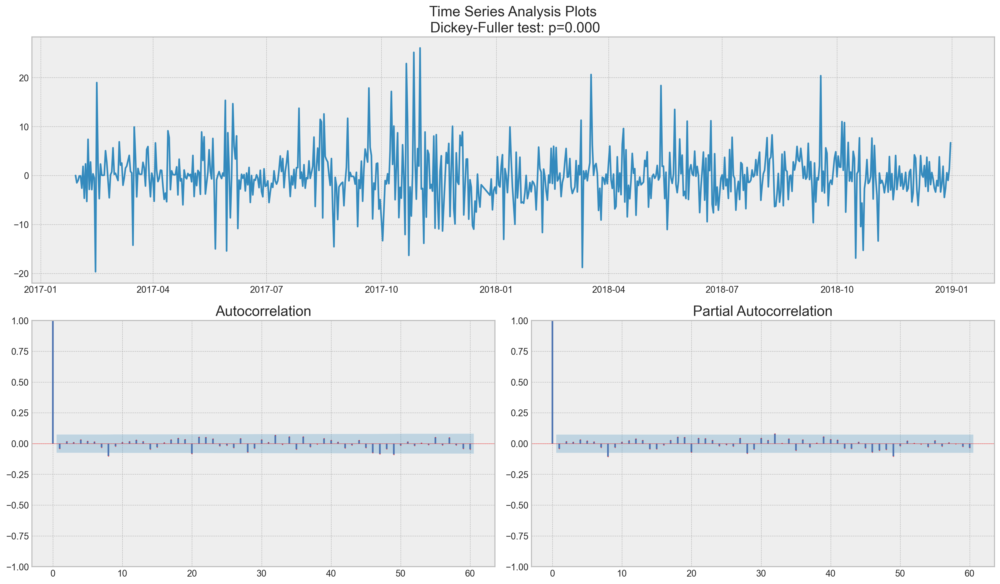

In [28]:
tsplot(best_model.resid[27 + 1 :], lags=60)

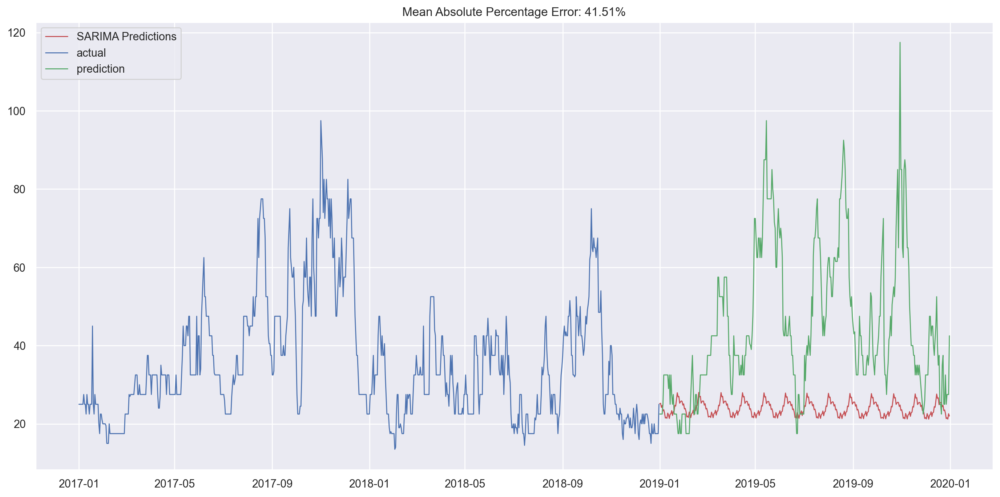

In [29]:
SARIMAXmodel = sm.tsa.statespace.SARIMAX(train_df, order=(p, d, q), seasonal_order=(P, D, Q, s))
SARIMAXmodel = SARIMAXmodel.fit()
y_pred = SARIMAXmodel.get_forecast(len(test_df.index))
y_pred_df = y_pred.conf_int(alpha = 0.05)
y_pred_df["Predictions"] = SARIMAXmodel.predict(start = y_pred_df.index[0], end = y_pred_df.index[-1])
y_pred_df.index = test_df.index
y_pred_out = y_pred_df["Predictions"] 
plt.plot(y_pred_out, color="r", label="SARIMA Predictions", linewidth=1.0)
plt.plot(train_df, label="actual",linewidth=1.0)
plt.plot(test_df, "g", label="prediction", linewidth=1.0)
error = mean_absolute_percentage_error(test_df.values, y_pred_df.Predictions)
plt.title(f"Mean Absolute Percentage Error: {error:.2f}%")
plt.legend()
plt.show()

In [30]:
def plotSARIMA(series, model, n_steps):
    """
        Plots model vs predicted values

        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future

    """
    # adding model values
    data = series.copy()
    data = pd.DataFrame(data)
    print(data.columns)
    data.columns = ["actual"]
    data["arima_model"] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data["arima_model"][: s + d] = np.NaN

    # forecasting on n_steps forward
    forecast = model.predict(start=data.shape[0], end=data.shape[0] + n_steps)
    forecast = data.arima_model._append(forecast)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(
        data["actual"][s + d :], data["arima_model"][s + d :]
    )

    plt.figure(figsize=(15, 7))
    plt.title(f"Mean Absolute Percentage Error: {error:.2f}%")
    plt.plot(train_df, label="actual",linewidth=1.0)
    plt.plot(test_df, "g", label="prediction", linewidth=1.0)
    plt.legend()
    plt.grid(True);

Index(['Average'], dtype='object')


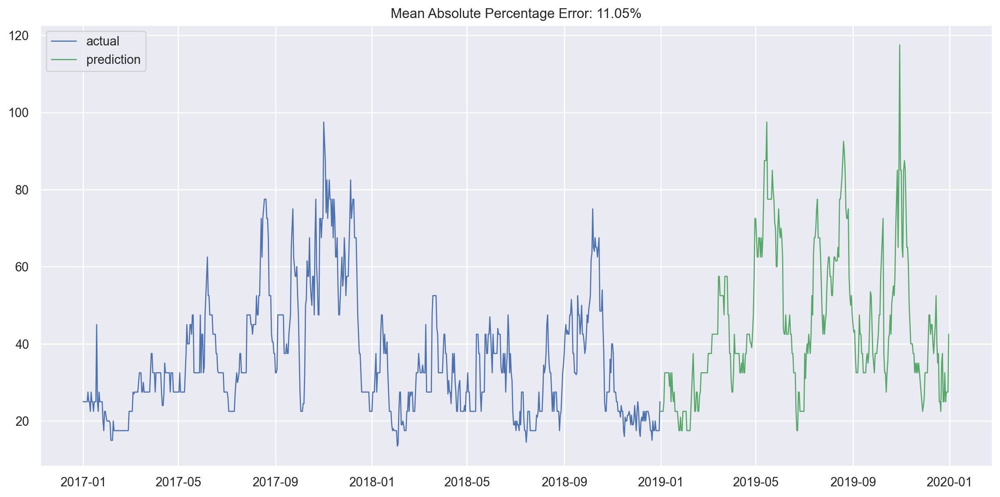

In [31]:
plotSARIMA(train_df, best_model, 50)

### Feature Extraction

With only a one-dimensional time series, it is worth considering what can be done to help regression recognize patterns in the data. We could extract following features from our data:
* Time series lag (shift dates in our initial time series by some value)
* Window statistics of a time window:
  * Minimum
  * Maximum
  * Average
  * Median
  * Variance
  * ...
* Date and time features:
  * Hour of a day, day of the week, day of the month, etc.
  * Holiday or other special occasions, for example 'Black Friday'
* Target encoding - using target variable to encode predictors. For example - find average price of a car make and make it new feature when our target is price prediction.

In [32]:
data = pd.DataFrame(df.Average.loc[(df.index.year >= 2017) & (df.index.year < 2020)].copy())
data.columns = ["y"]
data.tail(3)

,y
Date,
2019-12-29,27.5
2019-12-30,27.5
2019-12-31,42.5


First of all, we will create lags, the number of which will exceed the seasonality in the data.

Lag is just a shift in time series by arbitraty number of index steps. So for example a lag of 2 days will make data from target variable *y* appear 2 days after it actually happened. So if we lag on 01.03.2016 *y=34* by two days, we will see our *lag_2* feature appear on 03.03.2016 *lag_2=34*.

In [33]:
# Adding the lag of the target variable from 6 steps back up to 24
for i in range(2, 30):
    data["lag_{}".format(i)] = data.y.shift(i)

In [34]:
# take a look at the new dataframe
data.tail(3)

,y,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,...,lag_20,lag_21,lag_22,lag_23,lag_24,lag_25,lag_26,lag_27,lag_28,lag_29
Date,,,,,,,,,,,,,,,,,,,,,
2019-12-29,27.5,25.0,32.5,25.0,25.0,37.5,35.0,22.5,25.0,25.0,...,45.0,42.5,47.5,47.5,40.0,32.5,32.5,32.5,32.5,26.0
2019-12-30,27.5,27.5,25.0,32.5,25.0,25.0,37.5,35.0,22.5,25.0,...,45.0,45.0,42.5,47.5,47.5,40.0,32.5,32.5,32.5,32.5
2019-12-31,42.5,27.5,27.5,25.0,32.5,25.0,25.0,37.5,35.0,22.5,...,40.0,45.0,45.0,42.5,47.5,47.5,40.0,32.5,32.5,32.5


### Cross Validation in Time Series

The organization of the time-series data structure cannot be broken because the order in which the data are arranged carries the information. This means that the classical approach to cross validation through data sequence variation will not work on time series. Well, in this case, let's do it differently. Let's define some minimum sample on which it is possible to train the model. Using it for training, we will make a prediction for n time steps ahead. Next, we increase the training data by the same number of steps n, and make the prediction for such a model again for n steps forward. We continue the algorithm until the predictions are at the end of our data. In this way it is possible to obtain validation of the model on more than one time series using cross validation.

<p align="center">
  <img src="time_series_cross_validation.png" />
</p>

In [35]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import TimeSeriesSplit

# time-series cross-validation with 5 folds
tscv = TimeSeriesSplit(n_splits=5)

In [36]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    # get the index after which test set starts
    test_index = int(len(X) * (1 - test_size))

    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]

    return X_train, X_test, y_train, y_test

We set aside 30% of the data, which is around 1 year, for later testing of the model.

In [37]:
y = data.dropna().y
X = data.dropna().drop(["y"], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

We'll start with simple Linear Regression to set the baseline.

In [38]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [39]:
def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies

    """
    prediction = model.predict(X_test)

    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=1.0)
    plt.plot(y_test.values, label="actual", linewidth=1.0)

    if plot_intervals:
        cv = cross_val_score(
            model, X_train, y_train, cv=tscv, scoring="neg_mean_absolute_error"
        )
        mae = cv.mean() * (-1)
        deviation = cv.std()

        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)

        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)

        if plot_anomalies:
            anomalies = np.array([np.NaN] * len(y_test))
            anomalies[y_test < lower] = y_test[y_test < lower]
            anomalies[y_test > upper] = y_test[y_test > upper]
            plt.plot(anomalies, "o", markersize=10, label="Anomalies")

    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True)


def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)

    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind="bar")
    plt.grid(True, axis="y")
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles="dashed");

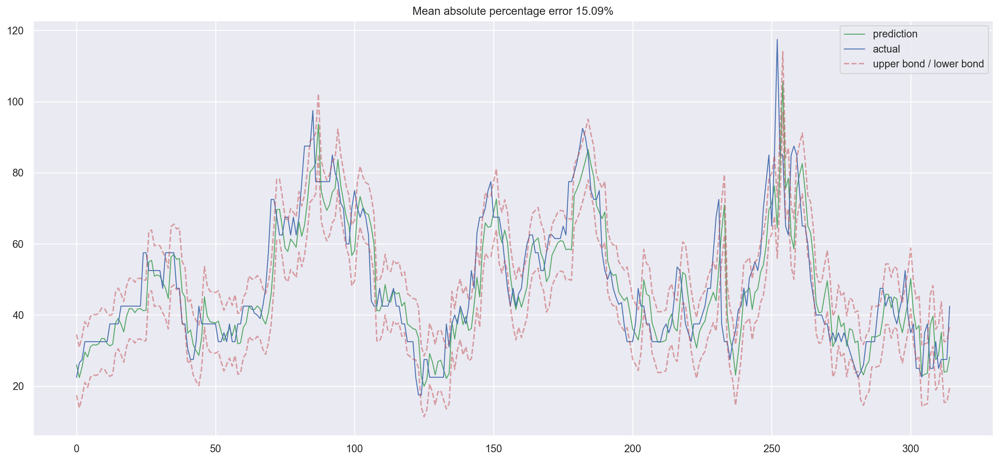

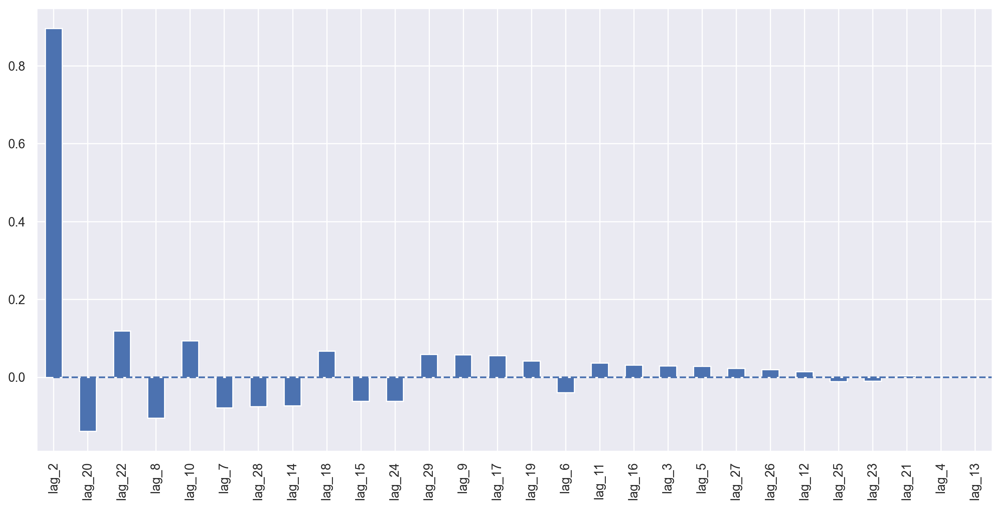

In [40]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

Now let's add a feature that will show what day of the week it is at the time of observation.

In [41]:
data.index = pd.to_datetime(data.index)
data["weekday"] = data.index.weekday
data.tail(3)

,y,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,lag_10,...,lag_21,lag_22,lag_23,lag_24,lag_25,lag_26,lag_27,lag_28,lag_29,weekday
Date,,,,,,,,,,,,,,,,,,,,,
2019-12-29,27.5,25.0,32.5,25.0,25.0,37.5,35.0,22.5,25.0,25.0,...,42.5,47.5,47.5,40.0,32.5,32.5,32.5,32.5,26.0,6
2019-12-30,27.5,27.5,25.0,32.5,25.0,25.0,37.5,35.0,22.5,25.0,...,45.0,42.5,47.5,47.5,40.0,32.5,32.5,32.5,32.5,0
2019-12-31,42.5,27.5,27.5,25.0,32.5,25.0,25.0,37.5,35.0,22.5,...,45.0,45.0,42.5,47.5,47.5,40.0,32.5,32.5,32.5,1


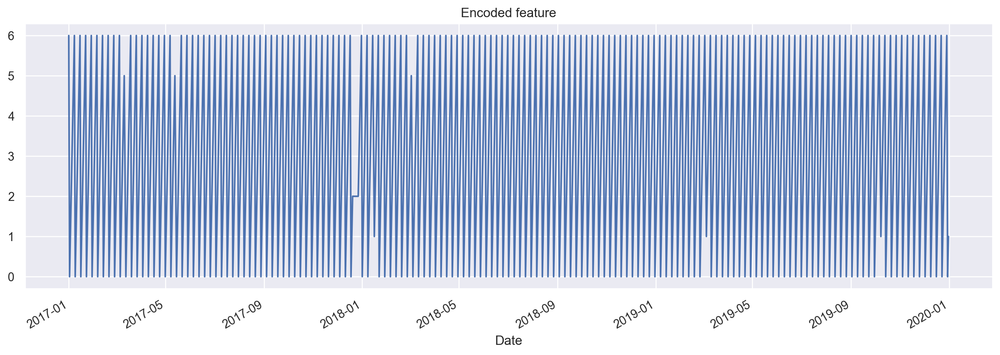

In [42]:
plt.figure(figsize=(16, 5))
plt.title("Encoded feature")
data.weekday.plot()
plt.grid(True);

Before applying the following models, we will use Z-transform of the data.

Z-transform is defined as follows:

$$z_{i} = \frac{x_{i}-\bar{x}}{S}$$

where:

$S$ is standard deviation of the series,

$\bar{x}$ is mean of the series.

The main reason we use this transformation is because after the application we get series with mean of 0, standard deviation of 1 and all data spread in bounds of [-1; 1] with standard distribution.

In [43]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

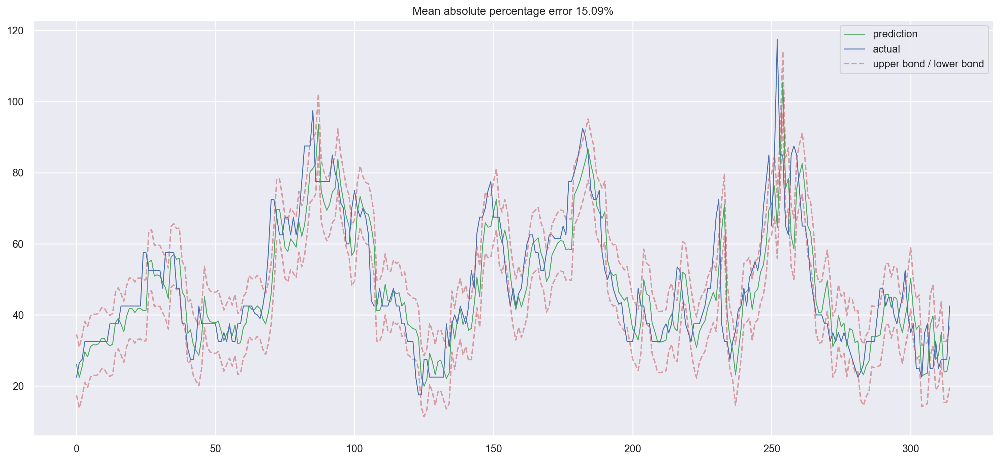

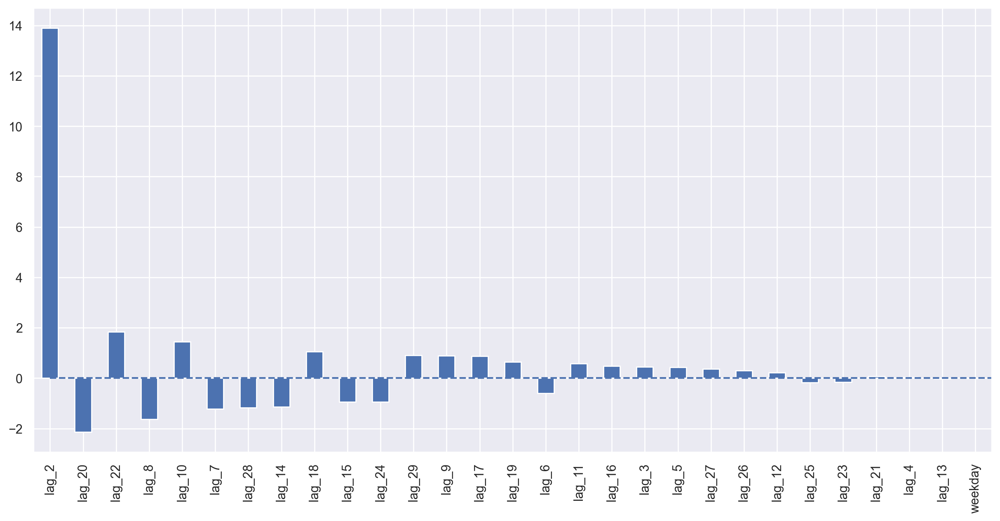

In [44]:
y = data.dropna().y
X = data.dropna().drop(["y"], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)

We will introduce target incoding by creating 'average for weekday' feature from 'weekday' feature.

In [45]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())

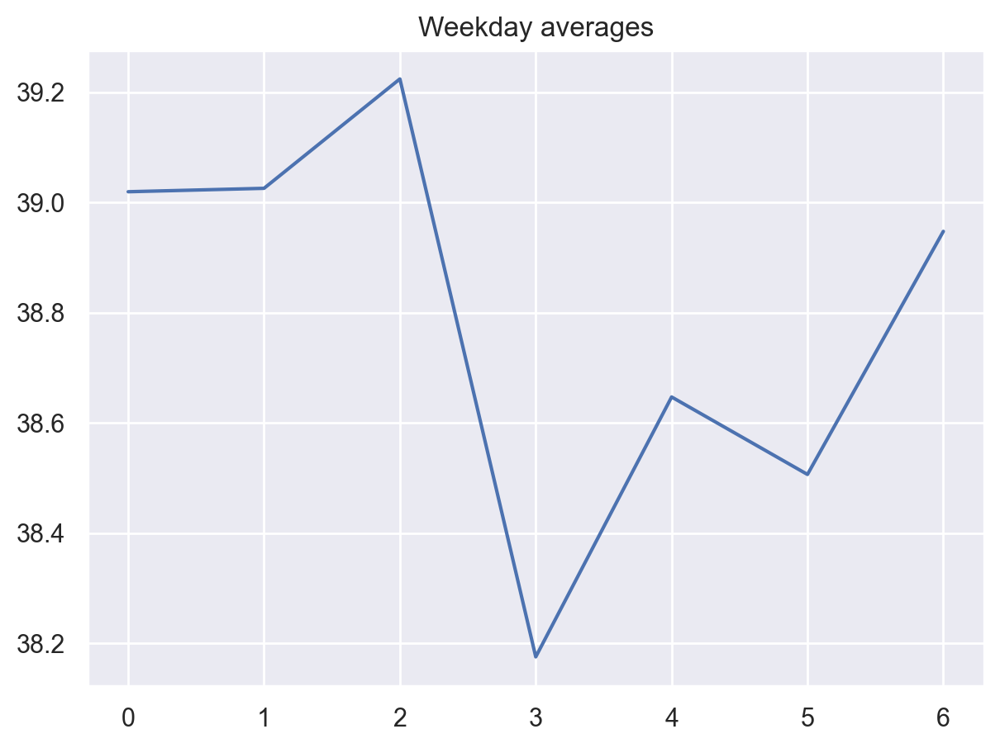

In [46]:
average_hour = code_mean(data, "weekday", "y")
plt.figure(figsize=(7, 5))
plt.title("Weekday averages")
pd.DataFrame.from_dict(average_hour, orient="index")[0].plot()
plt.grid(True);

Now let's glue together all of the previous steps in one function.

In [47]:
def prepareData(series, lag_start, lag_end, test_size, target_encoding=False):
    """
        series: pd.DataFrame
            dataframe with timeseries

        lag_start: int
            initial step back in time to slice target variable
            example - lag_start = 1 means that the model
                      will see yesterday's values to predict today

        lag_end: int
            final step back in time to slice target variable
            example - lag_end = 4 means that the model
                      will see up to 4 days back in time to predict today

        test_size: float
            size of the test dataset after train/test split as percentage of dataset

        target_encoding: boolean
            if True - add target averages to the dataset

    """
    # copy of the initial dataset
    data = pd.DataFrame(series.copy())
    data.columns = ["y"]

    # lags of series
    for i in range(lag_start, lag_end):
        data["lag_{}".format(i)] = data.y.shift(i)

    # datetime features
    data.index = pd.to_datetime(data.index)
    data["weekday"] = data.index.weekday

    if target_encoding:
        # calculate averages on train set only
        test_index = int(len(data.dropna()) * (1 - test_size))
        data["weekday_average"] = list(
            map(code_mean(data[:test_index], "weekday", "y").get, data.weekday)
        )
        # drop encoded variables
        data.drop(['weekday'], axis=1, inplace=True)

    # train-test split
    y = data.dropna().y
    X = data.dropna().drop(["y"], axis=1)
    X_train, X_test, y_train, y_test = timeseries_train_test_split(
        X, y, test_size=test_size
    )

    return X_train, X_test, y_train, y_test

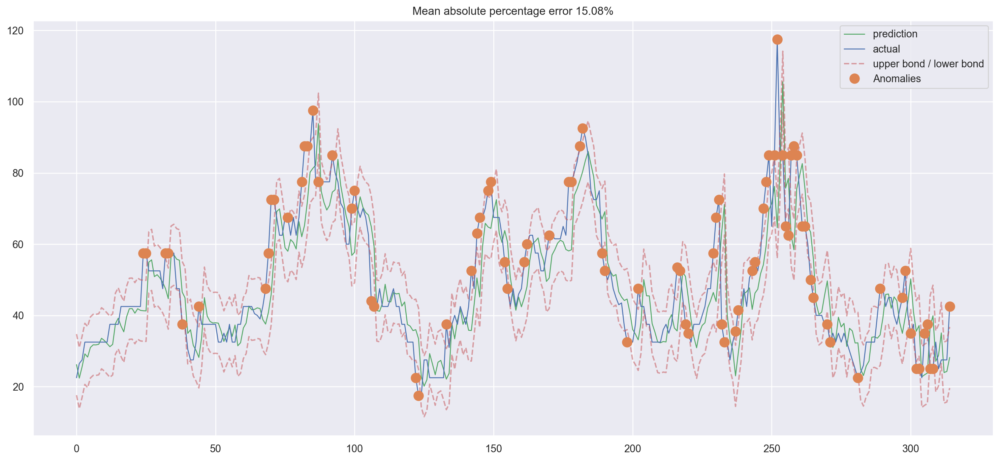

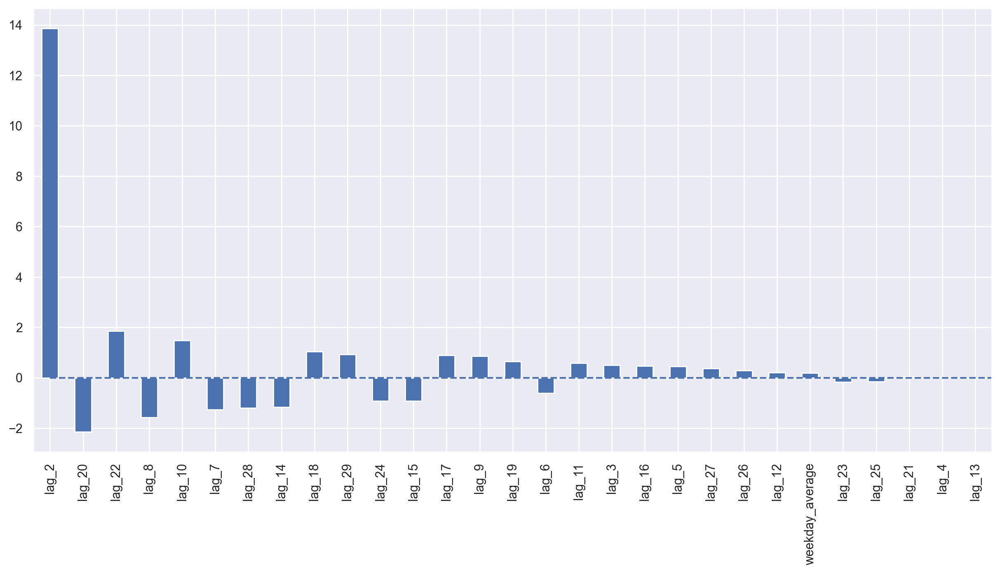

In [48]:
X_train, X_test, y_train, y_test = prepareData(pd.DataFrame(df.Average.loc[(df.index.year >= 2017) & (df.index.year < 2020)].copy()), 
                                               lag_start=2, lag_end=30, test_size=0.3, target_encoding=True)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True, plot_anomalies=True)
plotCoefficients(lr)

Seems like target encoding make our predictions just a tad better.

### Lasso and Ridge Regression models

Lasso and Ridge are both from a Regression family models. But they work differently.

**LassoCV** applies *L1* regularization which limits the size of coefficients by adding a penalty which is equal to absolute value of magnitude of coefficients. This leads to sparse models.

**RigdeCV** applies *L2* (Tikhonov) regularization for which the regression penalty is equal to square of magnitude of coefficients. This leads to dense models.

*In mathematics, "sparse" and "dense" often refer to the number of zero vs. non-zero elements in an array (e.g. vector or matrix). A sparse array is one that contains mostly zeros and few non-zero entries. A dense array contains mostly non-zeros.*

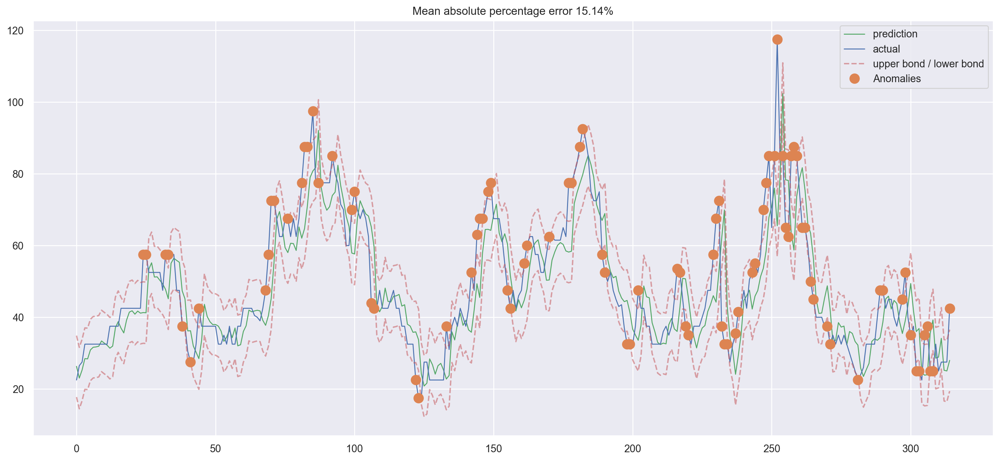

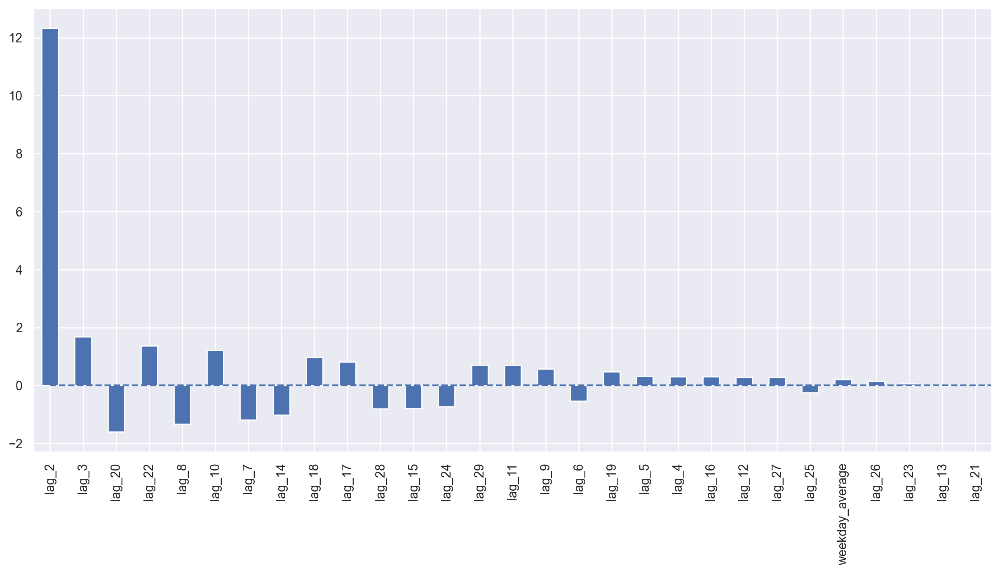

In [49]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscv)
ridge.fit(X_train_scaled, y_train)

plotModelResults(ridge, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True, plot_anomalies=True)
plotCoefficients(ridge)

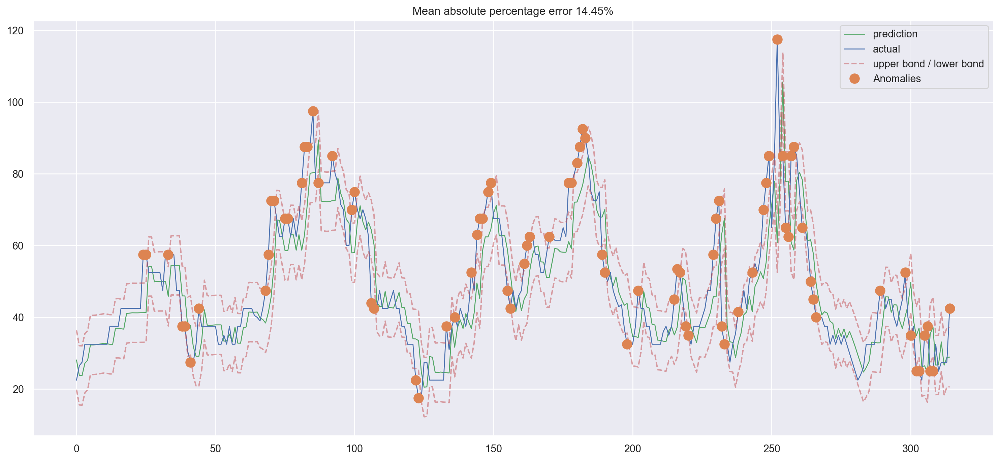

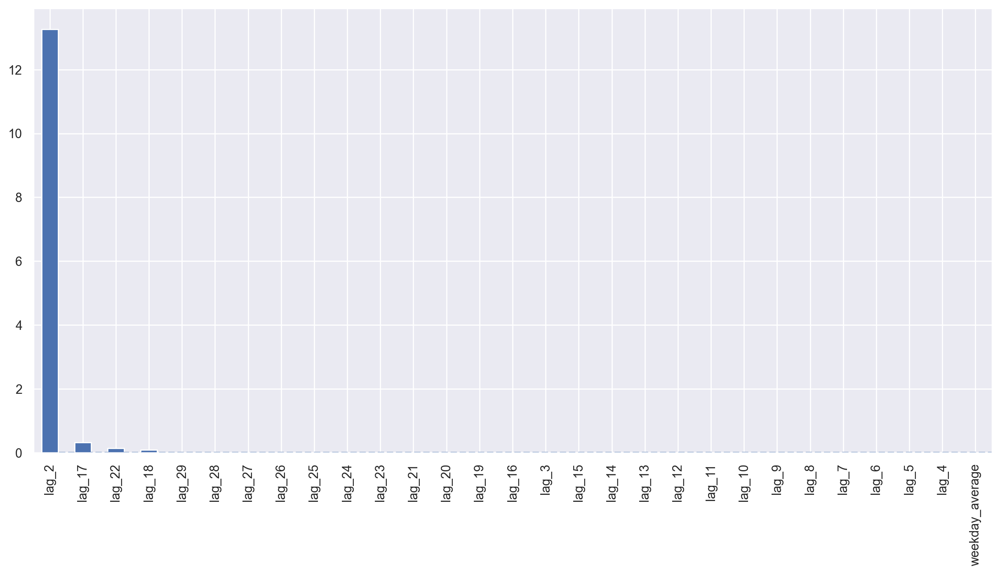

In [50]:
lasso = LassoCV(cv=tscv)
lasso.fit(X_train_scaled, y_train)

plotModelResults(lasso, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True, plot_anomalies=True)
plotCoefficients(lasso)

### XGBoost

In [51]:
from xgboost import XGBRegressor

xgb = XGBRegressor(verbosity=0)
xgb.fit(X_train_scaled, y_train);

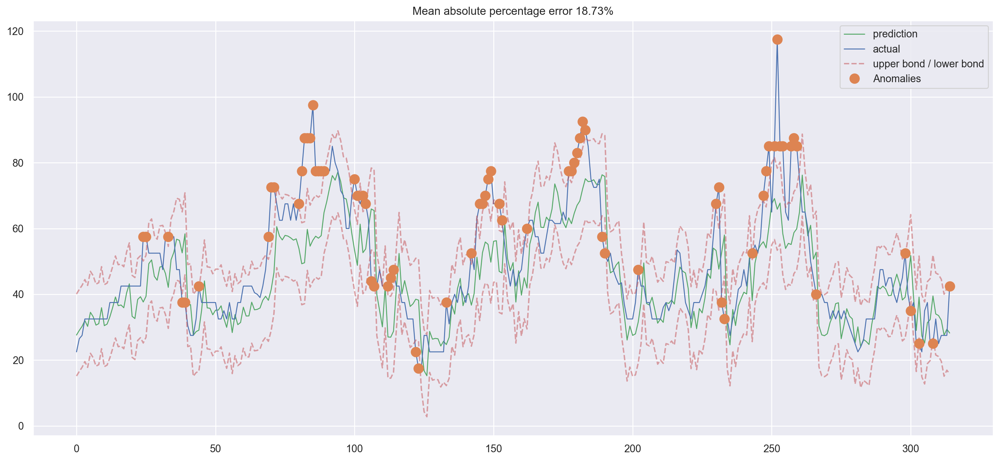

In [52]:
plotModelResults(xgb, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True, plot_anomalies=True)

While XGBoost clearly shows worst results with the same feature set, this doesn't mean it's worse method of modeling time series. With finer tuning of features and parameters it might be possible to beat ~14.5% MAPE Error of out best model so far, but it may require more time to do so.

### Prophet model

In [53]:
import logging

from prophet import Prophet

logging.getLogger().setLevel(logging.ERROR)

<Axes: xlabel='Date'>

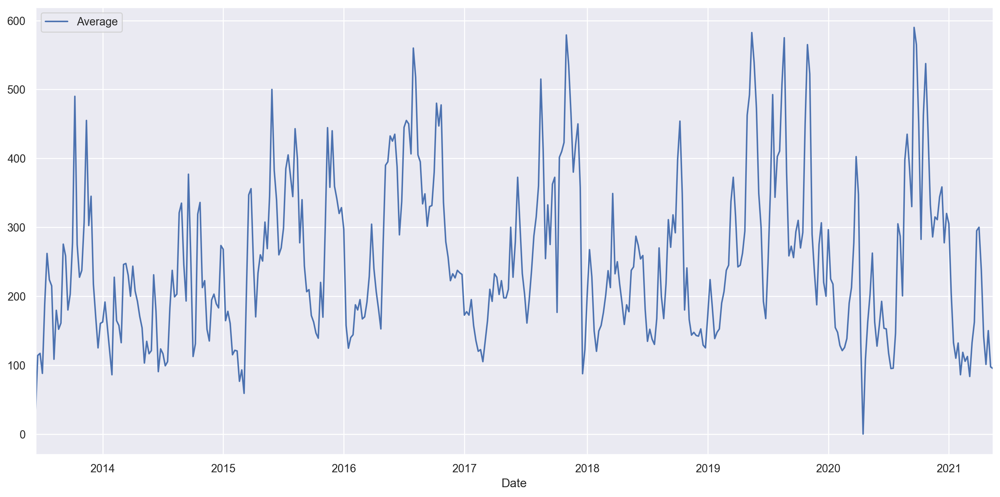

In [54]:
weekly_df = df.resample("W").apply(sum)
weekly_df.plot()

In [55]:
prophet_df = df.reset_index()
prophet_df.columns = ['ds', 'y']
prophet_df.tail(1)

,ds,y
2740,2021-05-13,37.5


In [56]:
prediction_len = 130
train_df = prophet_df[:-prediction_len]
train_df.tail(3)

,ds,y
2608,2020-12-29,47.5
2609,2020-12-30,47.5
2610,2020-12-31,42.5


In [57]:
prophet_model = Prophet()
prophet_model.fit(train_df)

10:26:02 - cmdstanpy - INFO - Chain [1] start processing
10:26:02 - cmdstanpy - INFO - Chain [1] done processing


In [58]:
future = prophet_model.make_future_dataframe(periods=prediction_len)
future.tail(3)

,ds
2738,2021-05-08
2739,2021-05-09
2740,2021-05-10


In [59]:
forecast = prophet_model.predict(future)
forecast.tail(3)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
2738,2021-05-08,40.757666,23.175087,60.162802,40.378461,41.142398,1.883405,1.883405,1.883405,-0.370144,-0.370144,-0.370144,2.253549,2.253549,2.253549,0.0,0.0,0.0,42.641072
2739,2021-05-09,40.757805,25.796919,62.075461,40.371411,41.148338,3.016148,3.016148,3.016148,0.286588,0.286588,0.286588,2.729559,2.729559,2.729559,0.0,0.0,0.0,43.773952
2740,2021-05-10,40.757943,25.547390,61.378746,40.364073,41.154278,3.458531,3.458531,3.458531,0.275503,0.275503,0.275503,3.183028,3.183028,3.183028,0.0,0.0,0.0,44.216474


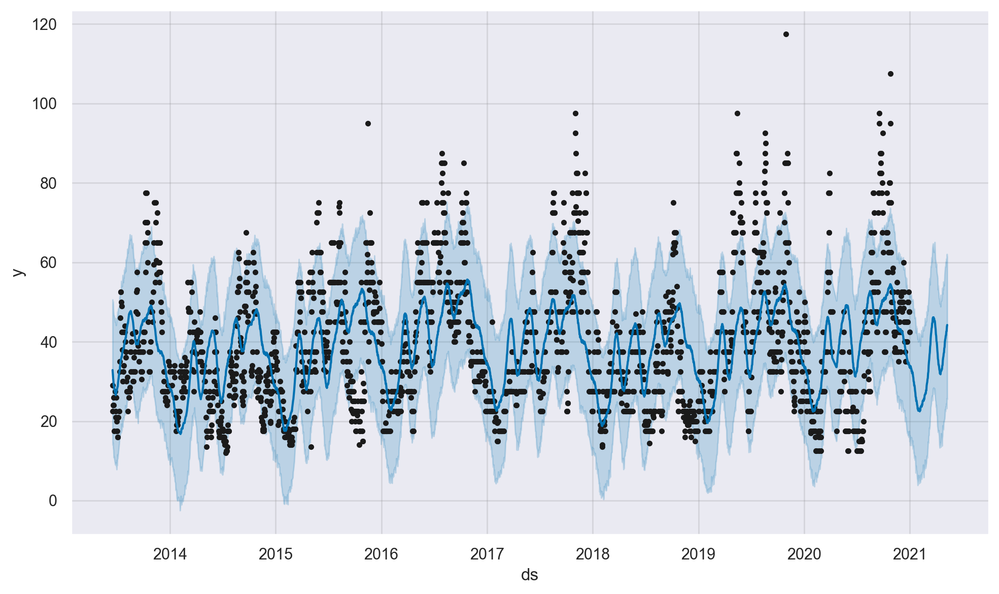

In [60]:
prophet_model.plot(forecast);

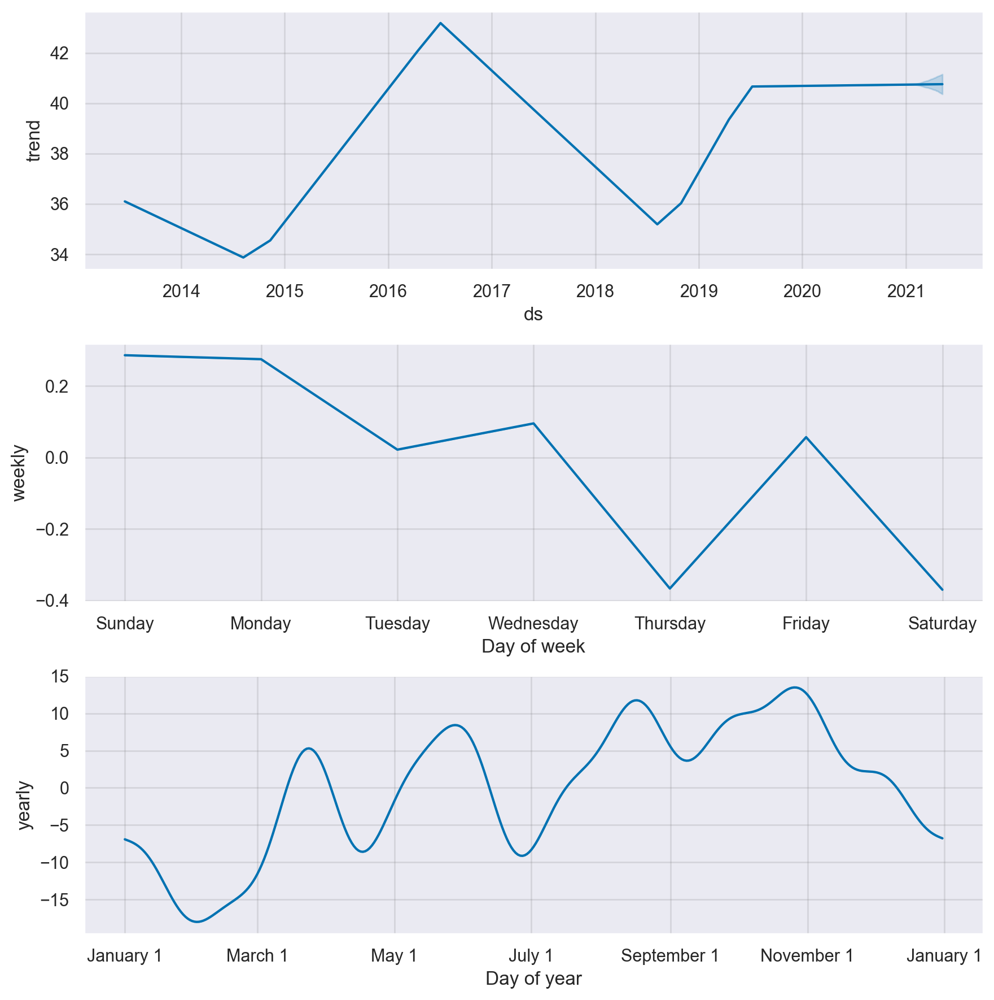

In [61]:
prophet_model.plot_components(forecast);

Let's merge our forecasts with original data frame.

In [62]:
merged_df = forecast.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(prophet_df.set_index('ds'))
merged_df.tail(3)

,yhat,yhat_lower,yhat_upper,y
ds,,,,
2021-05-08,42.641072,23.175087,60.162802,12.5
2021-05-09,43.773952,25.796919,62.075461,12.5
2021-05-10,44.216474,25.547390,61.378746,12.5


In [63]:
def calculate_forecast_errors(df, prediction_size):
    """Calculate MAPE and MAE of the forecast.

       Args:
           df: joined dataset with 'y' and 'yhat' columns.
           prediction_size: number of days at the end to predict.
    """

    # Make a copy of original df.
    df = df.copy()

    # Calculate the values of e_i and p_i according to the formulas.
    df["e"] = df["y"] - df["yhat"]
    df["p"] = 100 * df["e"] / df["y"]

    # Cut out the part of the data which we made our prediction for.
    predicted_part = df[-prediction_size:]

    # Define the function that averages absolute error values over the predicted part.
    error_mean = lambda error_name: np.mean(np.abs(predicted_part[error_name]))

    # Calculate MAPE and MAE and return the resulting dictionary of errors.
    return {"MAPE": error_mean("p"), "MAE": error_mean("e")}

MAPE = 72.61
MAE = 11.77


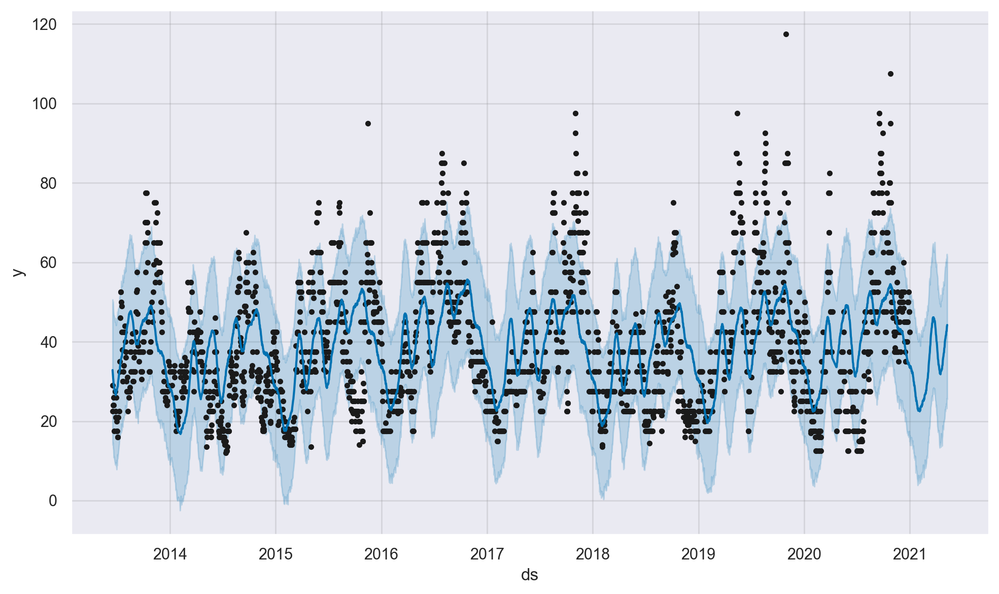

In [64]:
for err_name, err_value in calculate_forecast_errors(merged_df, prediction_len).items():
    print(f'{err_name} = {err_value:.2f}')
prophet_model.plot(forecast);

Without any tuning the MAPE of our model is 72% which is worse than all previously presented models.

### LSTM model

LSTM stands for Long-Short Term Memory. It is a variant of the Recurrent Neural Network(RNN). Historically RNN were created to use sequential information (time series are eqactly that) with a built-in ability to retain it's state of information and to perform the same task for each element of the sequence, while having the output depending on the previous calculation (that's where the word *recurrent* comes from). But models with RNN architecture were difficult to train. That lead to the creation of the new LSTM model, which has 5 essential components to model both long-term and short-term data:
 * the cell state,
 * hidden state,
 * input gate,
 * forget gate,
 * output gate.

<p align="center">
  <img src="LSTM_architecture.png" width='640' height='420'/>
</p>
 
The critical advantage of LSTM over other NNs is the ability to remember long-term sequences. Also, LSTM was able to take care of the vanishing gradient problem of traditional RNN.

In [65]:
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

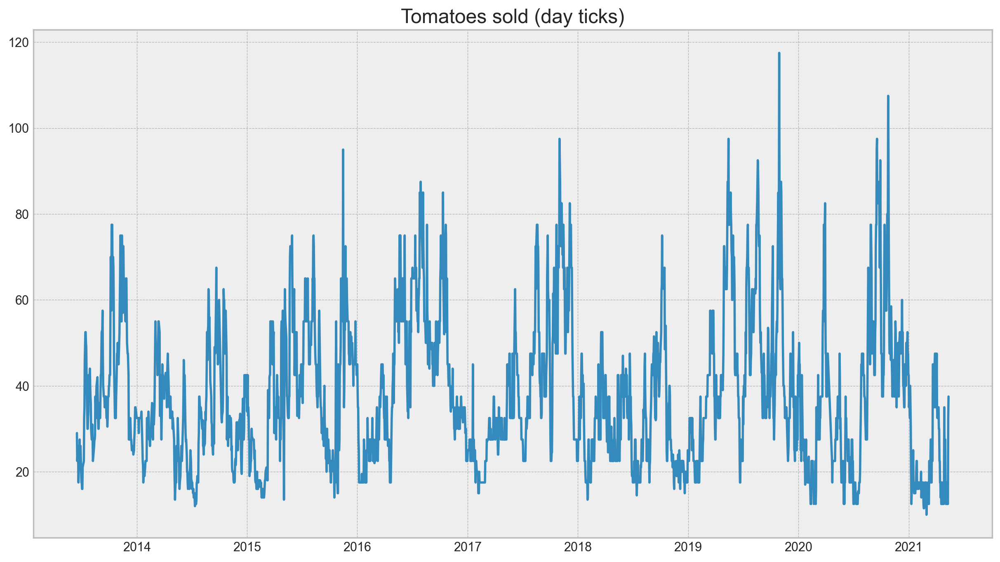

In [66]:
with plt.style.context("bmh"):
    plt.figure(figsize=(15, 8))
    plt.title("Tomatoes sold (day ticks)")
    plt.plot(df.Average);

In [67]:
# Making a function to break data, scale data, window data


def get_window_data(data, window):
    # Get window data and scale
    scaler = MinMaxScaler(feature_range=(0, 1))
    data = scaler.fit_transform(data.reshape(-1, 1))

    X = []
    y = []

    for i in range(len(data) - window - 1):
        X.append(data[i : i + window])
        y.append(data[i + window + 1])

    X = np.asarray(X)
    y = np.asarray(y)
    return X, y, scaler

In [68]:
window_size = 50
X, y, scaler = get_window_data(df.values, window_size)

test_split = int(len(df) * 0.8)

X_train = X[:test_split]
X_test = X[test_split:]

y_train = y[:test_split]
y_test = y[test_split:]

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2192, 50, 1), (498, 50, 1), (2192, 1), (498, 1))

It's time to dive deeper into Neural Networks structure, layers, tweaks and settings.
 * LSTM layer is exactly what has been described earlier in the text.
 * Dropout will randomly set *k percent* of input data to 0 to prevent overfitting.
 * Dense layer contains operation: *output = activation(dot(input, kernel) + bias)*. Activation function is applies element-wise and will be described next. Kernel is a weighted matrix, created layer by layer. Bias is a vector created by the layer.
 * Activation is a function, that calculates the output of the node. Most often *relu*, *softmax*, *sigmoid*, *tanh*, *exponential* or even *linear* activation function is used.
 * Optimizer is an algorithm or function that adapts the neural network’s attributes, like learning rate and weights. Hence, it assists in improving the accuracy and reduces the total loss. Some famous examples are *Stochastic Gradient Descent* (SGD), *Adam* (algorithm for first-order gradient-based optimization of stochastic objective functions, based on adaptive estimates of lower-order moments), *RMSprop*.
 * Loss function is similar to metrics functions. Basically any the metric could be used as loss function. But the loss function differs from a metric in that it is used within the model itself for calculation during training, while a metric can be passed as an ordinary parameter of the model and the final fitting result can be determined by it independently.

In [69]:
from keras.layers import LSTM, Activation, Dense, Dropout
from keras.models import Sequential

model = Sequential()
model.add(LSTM(50, input_shape=(window_size, 1)))  # 50neurons, and and window_size = 50
model.add(Dropout(0.2))
model.add(Dense(1))
model.add(Activation("linear"))
model.compile(loss="mse", optimizer="adam")

To fit the model we set epochs and batch size (in addition to the other more obvious parameters).
 * Epochs are basically the number of complete passes through the training dataset.
 * Batch size is a hyperparameter that defines the number of samples to work through before updating the internal model parameters.
 
Fit method will produce val_loss and loss as it's output. We will save it into a variable to plot loss over epoch graph later.

In [70]:
history = model.fit(
    X_train,
    y_train,
    epochs=20,
    batch_size=10,
    validation_data=(X_test, y_test),
    verbose=1,
    shuffle=False,
)

Epoch 1/20
220/220 [==============================] - 6s 14ms/step - loss: 0.0138 - val_loss: 0.0110
Epoch 2/20
220/220 [==============================] - 3s 11ms/step - loss: 0.0090 - val_loss: 0.0094
Epoch 3/20
220/220 [==============================] - 3s 12ms/step - loss: 0.0079 - val_loss: 0.0087
Epoch 4/20
220/220 [==============================] - 3s 11ms/step - loss: 0.0073 - val_loss: 0.0084
Epoch 5/20
220/220 [==============================] - 2s 11ms/step - loss: 0.0069 - val_loss: 0.0079
Epoch 6/20
220/220 [==============================] - 3s 14ms/step - loss: 0.0065 - val_loss: 0.0079
Epoch 7/20
220/220 [==============================] - 3s 11ms/step - loss: 0.0064 - val_loss: 0.0078
Epoch 8/20
220/220 [==============================] - 2s 11ms/step - loss: 0.0062 - val_loss: 0.0075
Epoch 9/20
220/220 [==============================] - 2s 11ms/step - loss: 0.0059 - val_loss: 0.0072
Epoch 10/20
220/220 [==============================] - 2s 11ms/step - loss: 0.0060 - val_lo

As always, we will use **MAPE** metric because of it's interpretability. 

We will also use *Mean Squared Error* (**MSE**). It is defined as follows:
$$ MSE = \frac{1}{n}\sum_{i=1}^{n}(y_{i}-\hat{y_{i}})^{2} $$

And *Root Mean Squared Error* (**RMSE**) is simply taking the square root of MSE:
$$ RMSE = \sqrt{\frac{1}{n}\sum_{i=1}^{n}(y_{i}-\hat{y_{i}})^{2}} $$

In [71]:
y_true = scaler.inverse_transform(y_test)
y_pred = scaler.inverse_transform(model.predict(X_test))

mape_lstm = mean_absolute_percentage_error(y_true, y_pred)

mse_lstm = mean_squared_error(y_true, y_pred)

print(f"RMSE for LSTM = {np.sqrt(mse_lstm):.2f}")
print(f"MAPE for LSTM = {mape_lstm:.2f}%")

16/16 [==============================] - 1s 6ms/step
RMSE for LSTM = 8.83
MAPE for LSTM = 22.80%


Let's create a couple helper functions to plot the dependence of the *loss variation on the epoch* and the *predictions* itselves.

In [72]:
def plot_history(history):
    plt.figure(figsize=(6, 4))
    plt.plot(history.history["loss"], label="Train")
    plt.plot(history.history["val_loss"], 'g', label="Test")
    plt.title("Loss over epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

def plot(X_test):
    pred = model.predict(X_test)
    pred_inverse = scaler.inverse_transform(pred.reshape(-1, 1))
    y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))

    # Calculate mean_squared_error. Previosly we did MinMax scale, so apply inverse_transform to recover values
    mape = mean_absolute_percentage_error(y_test_inverse, pred_inverse)
    plt.figure(figsize=(15, 8))
    plt.plot(pred_inverse, 'g', label="prediction", linewidth=1.0)
    plt.plot(y_test_inverse, label="actual", linewidth=1.0)
    plt.title(f"Test MAPE = {mape:.2f}%")
    plt.legend()
    plt.show()

 1/16 [>.............................] - ETA: 0s

16/16 [==============================] - 0s 6ms/step


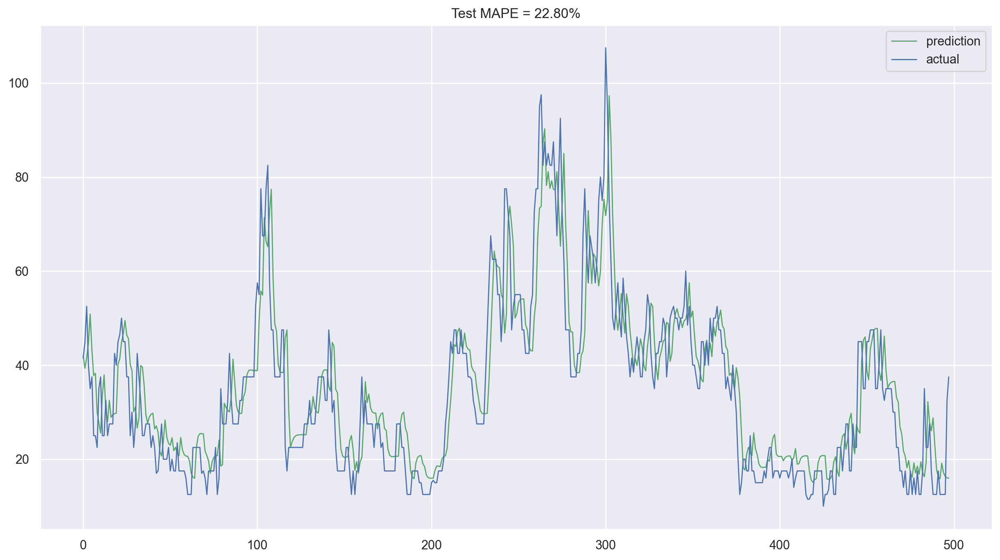

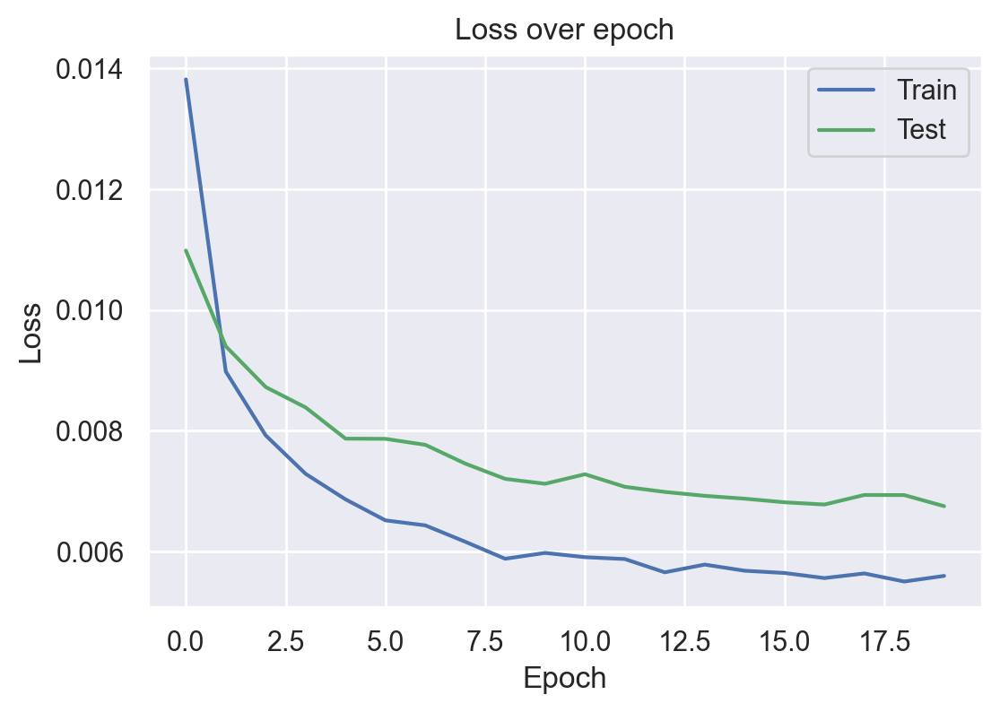

In [73]:
plot(X_test)
plot_history(history)

Let's try to change some parameters of the model to get a better result.

In [74]:
model = Sequential()
model.add(LSTM(50, input_dim=1, return_sequences=True)) # , output_dim=50
model.add(Dropout(0.1))
model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1))
model.add(Activation("linear"))
model.compile(loss="mse", optimizer="rmsprop")

In [75]:
history = model.fit(X_train, y_train, batch_size=256, epochs=20, validation_data=(X_test, y_test))

Epoch 1/20
9/9 [==============================] - 7s 228ms/step - loss: 0.0288 - val_loss: 0.0189
Epoch 2/20
9/9 [==============================] - 1s 124ms/step - loss: 0.0143 - val_loss: 0.0150
Epoch 3/20
9/9 [==============================] - 1s 113ms/step - loss: 0.0134 - val_loss: 0.0150
Epoch 4/20
9/9 [==============================] - 1s 113ms/step - loss: 0.0122 - val_loss: 0.0141
Epoch 5/20
9/9 [==============================] - 1s 111ms/step - loss: 0.0116 - val_loss: 0.0126
Epoch 6/20
9/9 [==============================] - 1s 109ms/step - loss: 0.0122 - val_loss: 0.0126
Epoch 7/20
9/9 [==============================] - 1s 112ms/step - loss: 0.0100 - val_loss: 0.0134
Epoch 8/20
9/9 [==============================] - 1s 114ms/step - loss: 0.0110 - val_loss: 0.0112
Epoch 9/20
9/9 [==============================] - 1s 112ms/step - loss: 0.0095 - val_loss: 0.0131
Epoch 10/20
9/9 [==============================] - 1s 110ms/step - loss: 0.0095 - val_loss: 0.0109
Epoch 11/20
9/9 [==

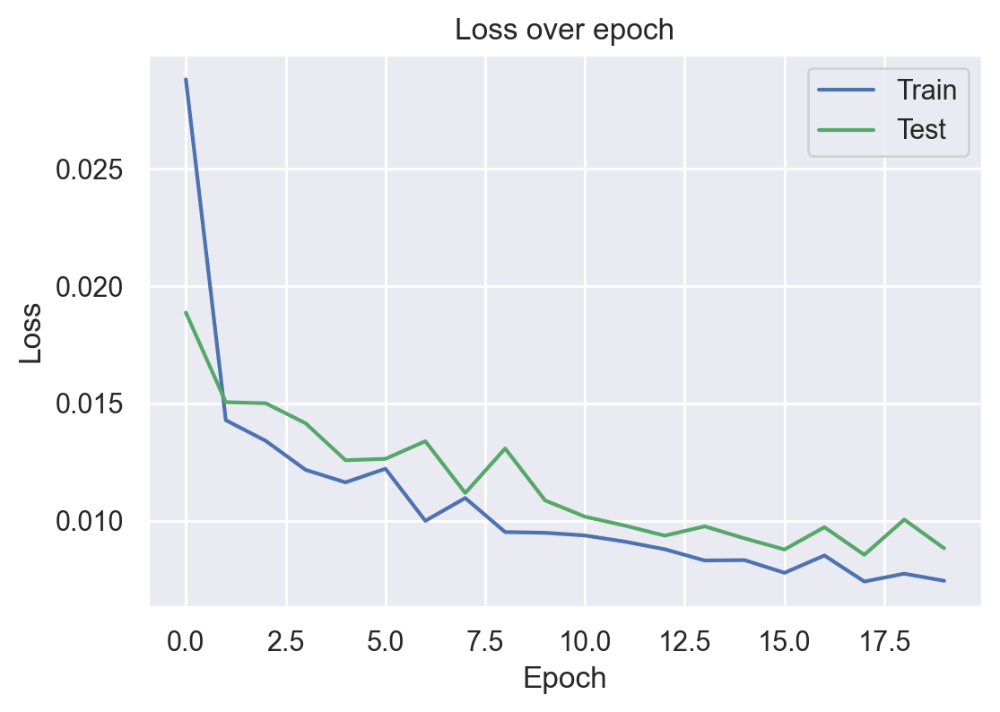

16/16 [==============================] - 1s 9ms/step


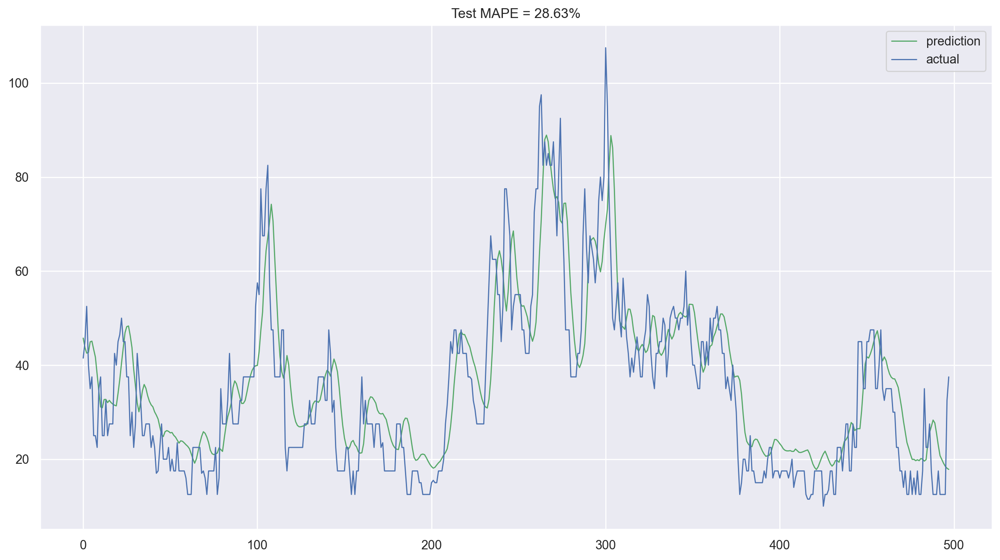

In [76]:
plot_history(history)
plot(X_test)

A little bit better, but still not perfect. Let's try more radical change of parameters.

In [77]:
window_size = 100

df_lstm = df.copy()
df_shift = df.copy()

for i in range(window_size):
    df_lstm = pd.concat([df_lstm, df_shift.shift(-(i + 1))], axis=1)
df_lstm.dropna(axis=0, inplace=True)

In [78]:
test_index = round(0.8 * df.shape[0])

X = df_lstm.iloc[:test_index, :]
y = df_lstm.iloc[test_index:, :]

X_train = X.iloc[:, :-1]
y_train = X.iloc[:, -1]
X_test = y.iloc[:, :-1]
y_test = y.iloc[:, -1]

In [79]:
scaler = MinMaxScaler(feature_range=(-1, 1))
X_train = scaler.fit_transform(X_train.values)
X_test = scaler.transform(X_test.values)


scalere = MinMaxScaler(feature_range=(-1, 1))
y_train = scalere.fit_transform(y_train.values.reshape(-1, 1))
y_test = scalere.transform(y_test.values.reshape(-1, 1))

X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

X_train.shape

(2193, 100, 1)

In [80]:
model = Sequential()
model.add(LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(Dropout(0.5))
model.add(LSTM(64))
model.add(Dropout(0.5))
model.add(Dense(1))
model.add(Activation("linear"))
model.compile(loss="mse", optimizer="adam")
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 100, 50)           10400     
                                                                 
 dropout_3 (Dropout)         (None, 100, 50)           0         
                                                                 
 lstm_4 (LSTM)               (None, 64)                29440     
                                                                 
 dropout_4 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
 activation_2 (Activation)   (None, 1)                 0         
                                                                 
Total params: 39,905
Trainable params: 39,905
Non-trai

In [81]:
history = model.fit(X_train, y_train, batch_size=64, epochs=20, validation_data=(X_test, y_test), verbose=1)

Epoch 1/20
35/35 [==============================] - 9s 122ms/step - loss: 0.0772 - val_loss: 0.0496
Epoch 2/20
35/35 [==============================] - 3s 95ms/step - loss: 0.0412 - val_loss: 0.0416
Epoch 3/20
35/35 [==============================] - 3s 92ms/step - loss: 0.0375 - val_loss: 0.0364
Epoch 4/20
35/35 [==============================] - 3s 94ms/step - loss: 0.0340 - val_loss: 0.0332
Epoch 5/20
35/35 [==============================] - 3s 97ms/step - loss: 0.0322 - val_loss: 0.0305
Epoch 6/20
35/35 [==============================] - 3s 94ms/step - loss: 0.0304 - val_loss: 0.0291
Epoch 7/20
35/35 [==============================] - 3s 95ms/step - loss: 0.0292 - val_loss: 0.0274
Epoch 8/20
35/35 [==============================] - 3s 98ms/step - loss: 0.0274 - val_loss: 0.0275
Epoch 9/20
35/35 [==============================] - 3s 95ms/step - loss: 0.0260 - val_loss: 0.0258
Epoch 10/20
35/35 [==============================] - 3s 94ms/step - loss: 0.0256 - val_loss: 0.0259
Epoch 11

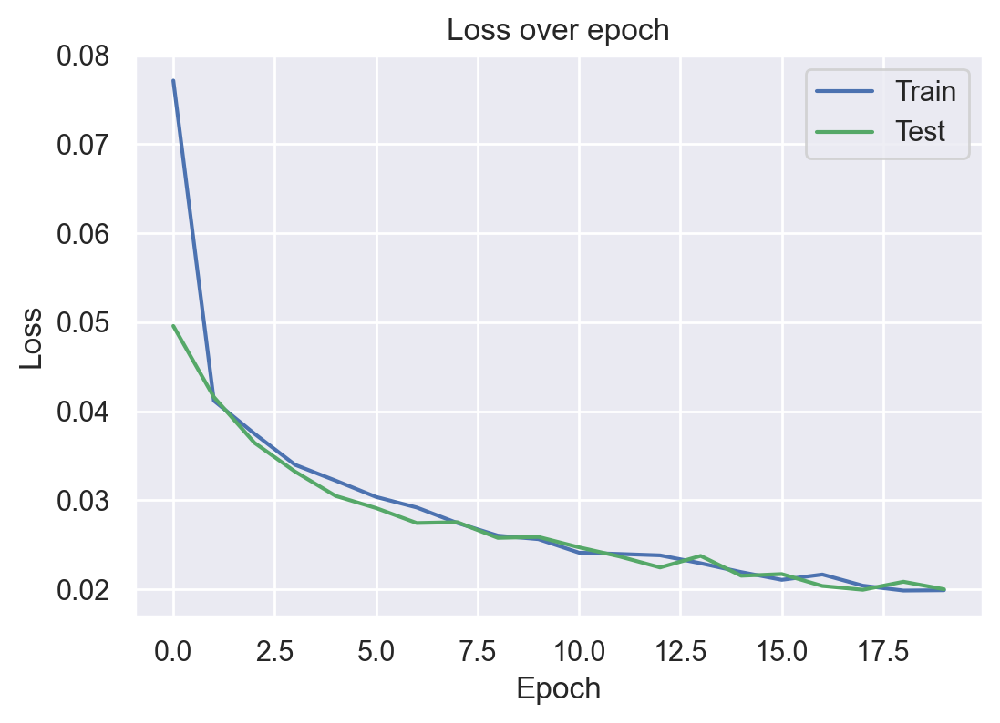

In [82]:
plot_history(history)

14/14 [==============================] - 1s 21ms/step


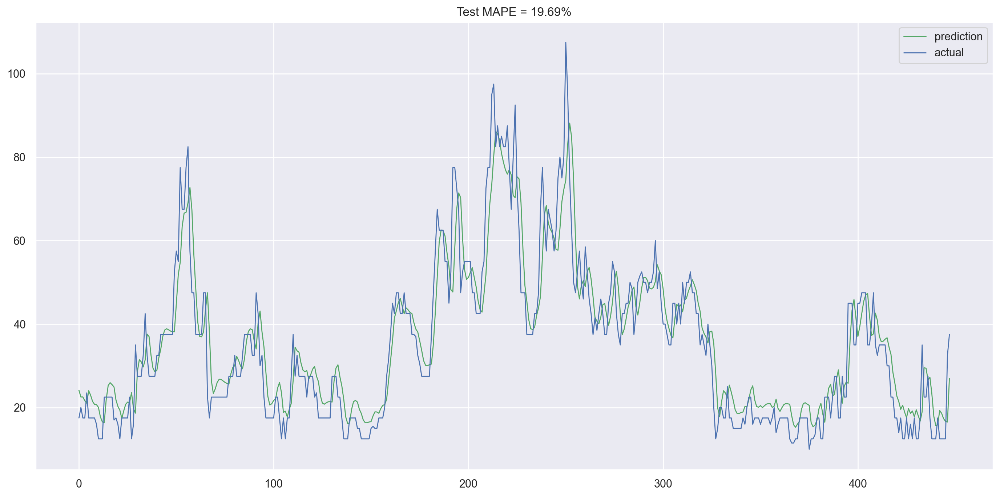

In [83]:
yhat = model.predict(X_test)
yhat_inverse = scalere.inverse_transform(yhat.reshape(-1, 1))
y_test_inverse = scalere.inverse_transform(y_test.reshape(-1, 1))

mape = mean_absolute_percentage_error(y_test_inverse, yhat_inverse)

plt.plot(yhat_inverse, "g", label="prediction", linewidth=1.0)
plt.plot(y_test_inverse, label="actual", linewidth=1.0)
plt.title(f"Test MAPE = {mape:.2f}%")
plt.legend()
plt.show()

Way better results with **18% MAPE**. Remeber, we started with 23.5%. But I think we still could do better than this!

In [84]:
X = df.Average.values.reshape(-1, 1).copy()
scaler = MinMaxScaler(feature_range=(0, 1))
X = scaler.fit_transform(X)

X.shape, df.Average.shape

((2741, 1), (2741,))

In [85]:
train_size = round(len(X) * 0.7)
test_size = len(X) - train_size
train, test = X[0:train_size, :], X[train_size : len(X), :]
print(len(train), len(test))

1919 822


In [86]:
def create_dataset(dataset, look_back=360):
    X, Y = [], []
    for i in range(len(dataset) - look_back):
        a = dataset[i : (i + look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)

In [87]:
look_back = 5
X_train, y_train = create_dataset(train, look_back)
X_test, y_test = create_dataset(test, look_back)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((1914, 5), (1914,), (817, 5), (817,))

In [88]:
# Making 3D vector
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

X_train.shape, X_test.shape

((1914, 1, 5), (817, 1, 5))

In [89]:
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dense(1))
model.compile(loss="mae", optimizer="adam")
history = model.fit(X_train, y_train, epochs=300, batch_size=100, validation_data=(X_test, y_test), verbose=0, shuffle=False)

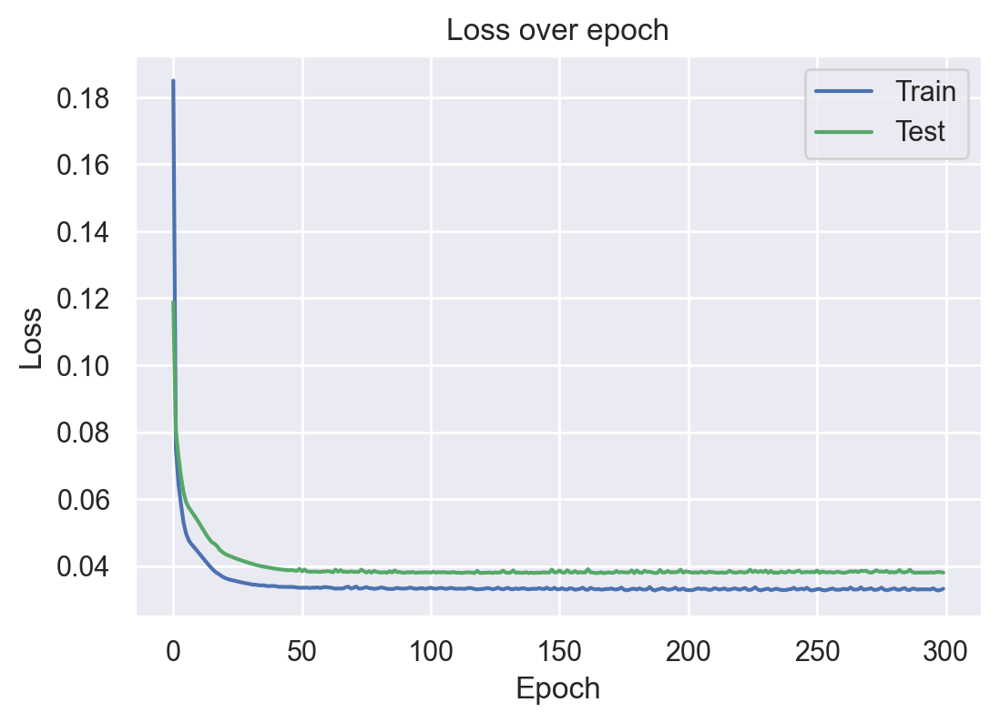

26/26 [==============================] - 0s 1ms/step


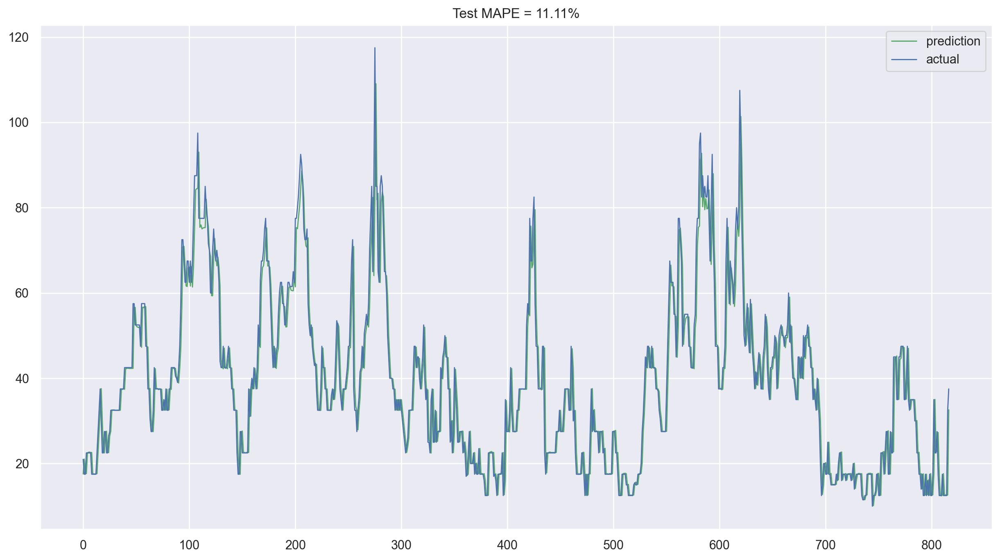

In [90]:
plot_history(history)
plot(X_test)

**11%** is the best MAPE score from any model so far. Using this LSTM model yealds amazing result.

### Conclusion

In conclusion, initial data analysis and research is extremely important and should not be skipped. SARIMA models can achieve excellent results, but it takes time to adjust them to an acceptable level. Classical regression models, on the other hand, will often require even more time and in-depth analysis than SARIMA. In my opinion, the Prophet library is somewhere in between in terms of speed and quality. At the same time, neural networks, and in particular LSTMs are a great example of ease of customization and excellent results. Although it takes time to train a NN, in general it is possible to find the necessary parameters quite quickly, while getting results comparable to any of the previous models, or even better. In my opinion, this analysis of time series prediction models perfectly shows the evolution in the industry. With each new model or prediction method, the ease and speed of model building, and with it the accuracy, increases.